# General instructions (this cell might be deleted for submission)
** <span style="color:red"> Write all the project in this file : code and explanations and upload it before January 14th at 23:55 </span> ** : 

<span style="color:red">Remember : Code cells must be smaller than 30 lines </span>

Every thing must be in the notebook :

* Explanation of what you want to do with data should be present in the Notebook
* Download data in the notebook (check the URL availability) and give the source of data (both URL and textual description)
* Give as much as possible characteristics of data (size, type, fields, ...)
* Provide visualisation of the data that you think useful
* Check for the consistence of the dataset (error, missing data,...) and correct and/or delete errors
* **Ask yourself a question that request you to perform an estimation** (for example, you can choose a data depending on time, and try to predict the latest 10% of data knowing the rest of data). **This will typically be solved through the proposal of a model and fitting the parameters of the model to (part of) the data.**

If you end up writing long chunks of code, make sure you split it in logical «smaller code cells» and explain the logic. The Juptyer Notebook will be **both the memoire** you will submit for evaluation **and the visual support** for your oral presentation of your project, keep this in mind while writing it.

# Project notebook


### Student 1 (first half presentation)
Name : Sacha Izadi
<br>Group : advanced
### Student 2 (second half presentation)
Name : Valentin Lapparov
<br>Group : advanced
### Data name : Mercari price suggestion challenge
### Data URL : https://www.kaggle.com/c/mercari-price-suggestion-challenge/download/train.tsv.7z
### Short summary of the project and datasource :

This project is based on the **Mercari price suggestion challenge** from Kaggle. Mercari is an e-commerce marketplace which faces challenges to know how much something is really worth. Small details can mean big differences in pricing. For example, one of these sweaters cost \$335 and the other cost \$9.99. Can you guess which one’s which?
<img src="Img/mercari_comparison.png" alt="Drawing" style="width: 500px;"/>

The aim of this project is to predict an optimal pricing for items given features like **name, brand, category level, item condition, included (or not) shipping fees**, and more challengingly **item description**. Indeed item descriptions are text and as such represent unstructured data; furthermore description "style" may widely vary from one seller to the other and thus add another degree of unstructurality. A lot of our work consisted in exploring the possibilities given by NLP for predicting the price of an item.

### Aims : 

##### The context
Founded in 2013, **Mercari** is an online marketplace that enables individuals to buy and sell products in various item categories (clothing, electronics, home, etc.). The company has a classical internet website, but mostly relies on its mobile app. Once the user has taken a picture of the item he is willing to sell, he just adds some more information such as **price**, **shipping options**, **category**, **price**, etc. before publishing his classified ad. Initially available in Japan, it is today accessible in the US and the UK.

<img src="Img/Mercari.png" alt="Drawing" style="width: 300px;"/>

##### The project
As previously explained, Mercari would like to be able to suggest price to its vendors in order to automatically provide the buyers with a wide range of products at the right price. Actually small details, such as brand or description, can mean big differences in pricing.

<img src="Img/item_example.png" alt="Drawing" style="width: 500px;"/>

##### Its aim
The **aim of this project** is to predict an optimal pricing for items given the features we have at our disposal :
* item name
* item condition (from 1 to 5, 1 being top-quality and 5 being low-quality)
* category levels (main category, and subcategories of level 1 & 2 - such as "Men/Tops/T-shirts")
* brand name
* shipping (1 meaning shipping fees to pay, and 0 meaning no fees)
* item description (at the discretion of the seller)
* and ... **price** the target variable of this project.

##### Plan
To do so, we adopted the following approach:

* Downloading the data (*more or less directly from the Jupyter notebook*).
* Quick description of the dataset.
* Thorough explanatory analysis of the dataset and data-cleaning meanwhile. 
 * We chosed to conduct our analyses by focusing on each variable and its link to the target variable *price*. 
 * We took the following order: **prices, shipping, item conditions, categories, brand names, item names**, and eventually **item descriptions**.
* Data modeling and prediction.

# Plan
1. 
2. 
3. 

# Preliminary tasks

### Import the libraries we use in this project
We mostly used standard and classical libraries used in data science with Python. We provided a very brief description about what they enabled us to perform. If you are running this notebook on your own laptop, you might need to `!pip install` some of them.

In [1]:
######## Import useful libraries ###########

### pip install some packages //////// uncomment the following lines if necessary.
#! pip install squarify
#! pip install wordcloud
#!pip install bokeh
#!pip install unidecode

#Downloading the data from the notebook
import urllib.request as ur

#Handling the dataset
import pandas as pd
import pickle

#Classic Python
import numpy as np
from scipy import stats

#Plotting and visualizing data
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
from wordcloud import WordCloud

#Dynamic plotting based on JavaScript
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook

#Natural language processing + kmeans clustering + dimensionality reduction functionalities
import nltk
import re
import unidecode
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import sklearn.manifold
from sklearn.cluster import MiniBatchKMeans

#Prediction tool kit
from sklearn.neighbors import KNeighborsRegressor

%matplotlib inline

### Download the dataset: 

A few comments about how to download the dataset:
 
* We only download the training dataset of the challenge (not the testing set with no `price` column.
* By runing the first chunk of code you download the **compressed** dataset in your **working directory**.
* Unfortunately <span style="color:red">we did not manage to unzip the compressed filed directly from the notebook ...</span>. However here is our guidelines for being in the same configuration as ours :
 * Unzipp the **train_tsv.7z** with your prefered archive manager.
 * Rename train_tsv.7z to **Mercari_data.tsv**
 * Create a folder named **Data** inside your working directory, and move **Mercari_data.tsv** in it.
 * You're now all set! Sorry for the inconvenience...
* We then load the dataset in a pandas Data.Frame.

In [24]:
######## donwload data from its source ###########
import urllib.request as ur

print('Downloading data...')
data_file = 'train_tsv.7z'
ur.urlretrieve ("https://www.kaggle.com/c/mercari-price-suggestion-challenge/download/train.tsv.7z", data_file)
print('Download complete.')

Download complete.


In [30]:
### >>> Actually we had an issue when unzipping the file ... we had to do it by hand!
### >>> See the previous markdown chunk for more information


####### unzip file ###########

# >>> Uncomment the following line to install the packages needed for unzipping
#! pip install pyunpack
#! pip install patool
from pyunpack import Archive
data_file = 'train_tsv.7z'
print('Unzipping')
#Archive(data_file).extractall('Data',auto_create_dir=True)
print('Done!')



### >>> Actually we have an issue when unzipping the file ... we had to do it by hand !


Unzipping
Done!


In [2]:
# Load the data set in a pandas DataFrame

print("Loading the dataset in a pandas DataFrame...")
data_mercari = pd.read_csv('Data/Mercari_data.tsv', sep='\t')
print("Loading completed.")

Loading the dataset in a pandas DataFrame...
Loading completed.


### First consistency checks and data-cleanings: 

In [3]:
# 1st Sanity check :
data_mercari.head(3)

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...


In [4]:
## We remove train_id because it's useless
data_mercari.drop('train_id',axis=1,inplace=True)
## We Have a first check of the consistency of the data type (eg.  spot if prices are saved as character strings)
data_mercari.dtypes

name                  object
item_condition_id      int64
category_name         object
brand_name            object
price                float64
shipping               int64
item_description      object
dtype: object

In [5]:
# Let's check the proportion of missing data (NaN) in the dataset
print ("Percentage of NaN in the dataset (in %)")
print(data_mercari.isnull().sum()/data_mercari.size*100)

Percentage of NaN in the dataset (in %)
name                 0.000000
item_condition_id    0.000000
category_name        0.060967
brand_name           6.096527
price                0.000000
shipping             0.000000
item_description     0.000039
dtype: float64


In [6]:
# As there is only few NaN, removing them won't change the analysis too much
# ... So we remove them!
data_mercari=data_mercari[pd.notnull(data_mercari['item_description'])]
data_mercari=data_mercari[pd.notnull(data_mercari['category_name'])]
data_mercari=data_mercari[pd.notnull(data_mercari['brand_name'])]

In [7]:
# Let's split the categories like "Electronics/Computers & Tablets/Components & Parts" 
# into main & sub categories (1 & 2)
data_mercari['main_cat'], data_mercari['subcat_1'], data_mercari['subcat_2'] = \
data_mercari['category_name'].str.split('/', 2).str

In [9]:
# Let's put some order in the columns of the dataset
data_mercari.drop('category_name',axis=1,inplace=True)
cols = data_mercari.columns.values.tolist()
cols = cols[0:2] + cols[-3:] + cols[2:6]
data_mercari = data_mercari[cols]

In [12]:
data_mercari.head(3)

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description
1,Razer BlackWidow Chroma Keyboard,3,Electronics,Computers & Tablets,Components & Parts,Razer,52.0,0,This keyboard is in great condition and works ...
2,AVA-VIV Blouse,1,Women,Tops & Blouses,Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...
6,Acacia pacific tides santorini top,3,Women,Swimwear,Two-Piece,Acacia Swimwear,64.0,0,Size small but straps slightly shortened to fi...


In [13]:
# Pickling the cleaned data for using it later on
data_mercari.to_pickle("data_mercari_removeNanSeparateCat.pickle")

In [14]:
# Opening the pickle data
with open('data_mercari_removeNanSeparateCat.pickle', 'rb') as f:
    data_mercari = pickle.load(f)

# Explanatory analysis

In the following sections we analyse thoroughly the dataset. Our approach focuses on the distribution of each potenatial explanatory variable and its correlation to the target variable a.k.a. the item `price`.

In their order of apparition, we focused on:
* **`price`**
 * a positive float
 * our target variable
* **`shipping`**
 * an integer either 0 or 1
 * 0 means no shipping fees to pay (by the buyer) and 1 eans shipping fees to pay
* **`item_condition_id`**
 * an integer between 1 and 5
 * 1 means excellent condition and 5 being poor condition (broken, damaged...)
* **category levels (`main_cat`,`subcat_1`,`subcat_2`)** 
 * a character string
 * main category, and subcategories of level 1 & 2 - such as "Men/Tops/T-shirts"
* **`brand_name`**
 * a character string
 * the name of the brand
* **`name`**
 * a character string
 * the name of the item sold
* **`item_description`**
 * a character string
 * the description of the item, at the discretion of the vendor

In this approach, we especially focus on 3 main tasks:

* **Data charateristics.**
* **Data visualisation and representation.**
* **Data consistency checking.**

The first two tasks are highly linked one to each other since visualisation helps us giving as much characteristics of the data as possible. The consistency checking was done on the go when looking for, or spotting, inconsistency. This led us to perform the adequate the data-cleaning.

# Analysing the `price` variable

Let's first do some basic statistics on the `price` variable. 
* We see that most of the prices lie between \$0 and \$30.
* But some items are sold for free (min=\$0) whereas others are very expensive (max=\$2009) !

In [15]:
data_mercari.price.describe()

count    846982.000000
mean         30.917965
std          44.742851
min           0.000000
25%          12.000000
50%          20.000000
75%          34.000000
max        2009.000000
Name: price, dtype: float64

To better see it, we plot the density distribution of `price` using the library `seaborn` based on matplotlib and specially designed for statistical vizualisation.

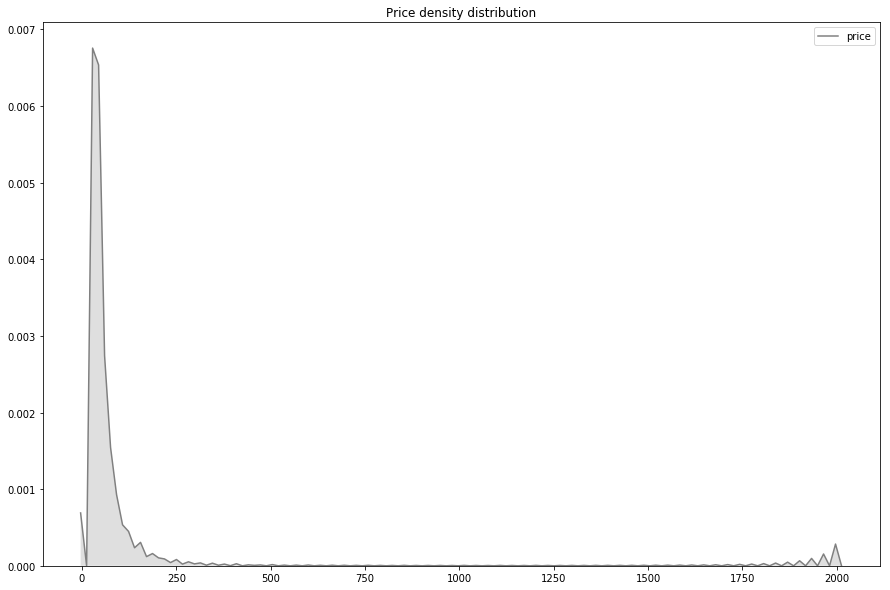

In [16]:
plt.figure(figsize=(15,10)) 
plt.title('Price density distribution')
sns.kdeplot(data_mercari['price'], shade=True, color="grey")

plt.show()

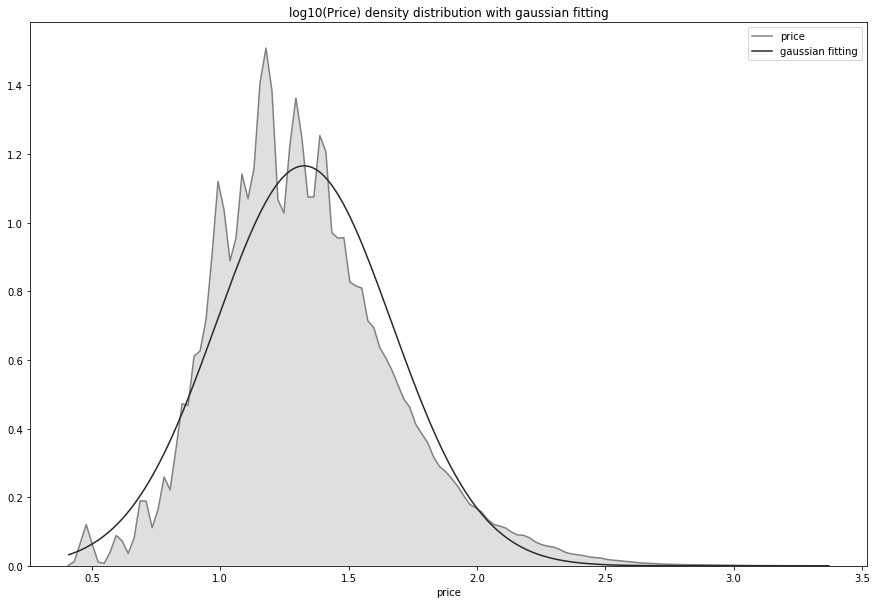

In [18]:
# As prices vary between $0 and $2000 with a high concentration around $30, we can have a better view 
# by plotting the log10(price) density distribution

plt.figure(figsize=(15,10)) 
plt.title('log10(Price) density distribution with gaussian fitting')
sns.kdeplot(np.log10(data_mercari.price[data_mercari.price!=0]), shade=True, color="grey")
sns.distplot(np.log10(data_mercari.price[data_mercari.price!=0]), hist=False, kde = False, fit=stats.norm, label='gaussian fitting')
plt.legend()
plt.show()

Let's see who the outliers (`price` = \$0 and `price` > \$1900) are.

In [19]:
# price = $0
pd.DataFrame.head(data_mercari[data_mercari.price==0])

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description
2544,Levi leggings,3,Women,Jeans,"Slim, Skinny",Levi's®,0.0,0,Light wash. Hardly worn. Size 24 but fits like...
5237,Nursing Bra,3,Women,Underwear,Bras,Motherhood Maternity,0.0,0,Used a few times but was not able to nurse
7116,Nike Dri-Fit High Power Speed Tights,1,Women,Athletic Apparel,"Pants, Tights, Leggings",Nike,0.0,1,"Bought at Nike store in New York, Brand New, N..."
12738,Beautiful Janie and Jack loafers sz 4,2,Kids,Boys 2T-5T,Shoes,Janie and Jack,0.0,0,Like New
19909,Obey Floral Snapback Hat,2,Men,Men's Accessories,Hats,Obey,0.0,0,A friend sold me this hat although I don't wea...


In [20]:
#price > $1900
data_mercari[data_mercari.price > 1900]

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description
180749,NEW apple products,1,Electronics,Cell Phones & Accessories,Cell Phone Accessories,Apple,1909.0,0,"bundle includes: ipad pro keyboard, iphone 6S ..."
415027,Chanel Classic Jumbo Single flap bag,3,Women,Women's Handbags,Shoulder Bag,Chanel,2000.0,1,Authentic. Pre-loved in Excellent Condition. P...
742113,Chanel Chevron Fuschia Pink 2,1,Women,Women's Handbags,Shoulder Bag,Chanel,2000.0,1,Authentic Brand new The price for this is [rm]...
760469,NEW Chanel WOC Caviar Gold Hardware,1,Women,Women's Handbags,Shoulder Bag,Chanel,2009.0,0,"New with tag, box and dustbag but no receipt. ..."
778940,Mary kay,1,Beauty,Makeup,Face,Mary Kay,2000.0,1,30 time wise sets Oily to combo skin
956343,Chanel Black wallet on chain,1,Women,Women's Handbags,Messenger & Crossbody,Chanel,2000.0,1,Lambskin Color is Black with dark Silver Hardw...
1250053,Brand New Chanel CC Quilted WOC,2,Women,Women's Handbags,Messenger & Crossbody,Chanel,2000.0,1,This is a brand new Chanel CC Quilted Wallet o...
1262245,NEW-Chanel Boy Wallet o Chain WOC Caviar,1,Women,Women's Handbags,Messenger & Crossbody,Chanel,2006.0,0,Brand: Chanel Style: WOC Boy Wallet on Chain T...
1393600,David Yurman Wheaton ring,2,Women,Jewelry,Rings,David Yurman,2004.0,0,David Yurman Wheaton wing. Size 6. Original re...


We see that the very expensive outliers are consistent with the item sold (luxury goods) whereas the free items are not. We will drop all free items in order to keep consistency of the dataset!

In [21]:
data_mercari = data_mercari[data_mercari.price != 0]
print("Minimum price is now: $",min(data_mercari.price),": No item is free anymore.")

Minimum price is now: $ 3.0 : No item is free anymore.


In [22]:
# We save the result of this 2nd cleaning in a new pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree.pickle")

# Analysing the `shipping` variable

Let's analyse the influence of `shipping` fees on the `price` of the items sold, by plotting the density distribution of $\log_{10}(price)$ in each sub-group `shipping==1` & `shipping==0`.

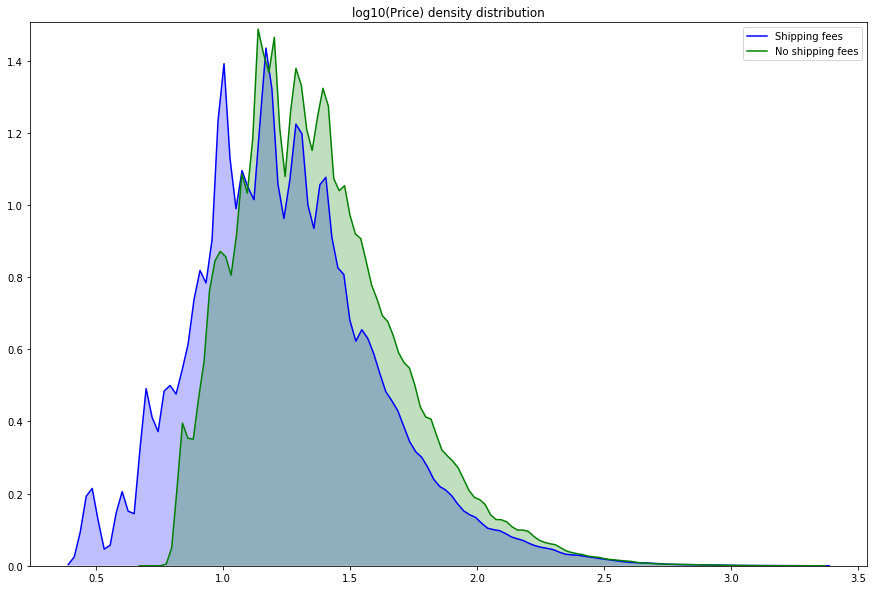

In [23]:
plt.figure(figsize=(15,10))
plt.title('log10(Price) density distribution')
#plt.legend()
sns.kdeplot(np.log10(data_mercari.price[data_mercari.shipping==1]), shade=True, color="blue", label='Shipping fees')
sns.kdeplot(np.log10(data_mercari.price[data_mercari.shipping==0]), shade=True, color="green", label='No shipping fees')

plt.show()

As expected, items with low `prices` require to pay a shipping fee more often than high `prices`. Indeed with high `prices` vendors can lower their margin to bear the cost of shipping.

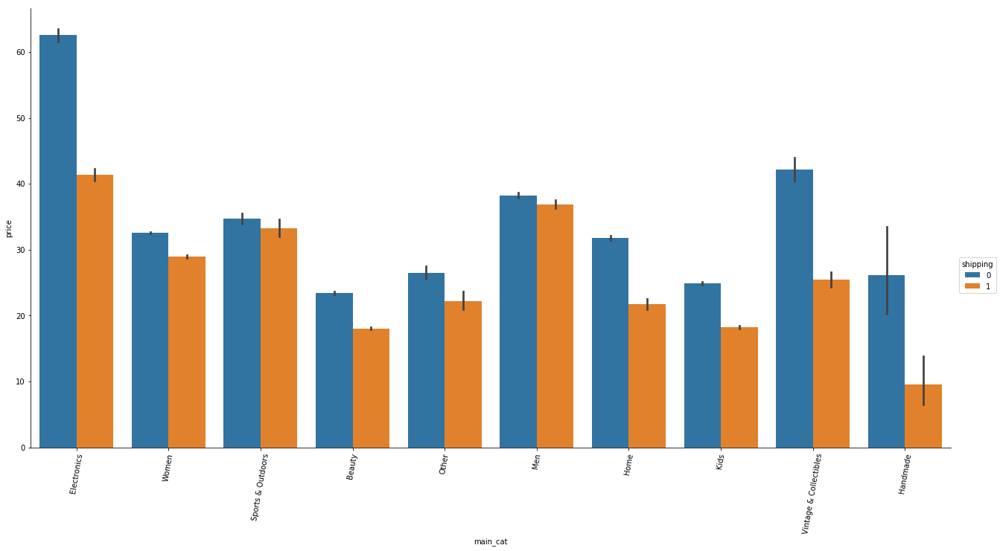

In [24]:
# Price for category with and without shiping

temp = sns.factorplot(x='main_cat', y='price', hue='shipping', data=data_mercari, size=9, aspect=2, kind='bar');
temp.set_xticklabels(rotation=80);

# Analysing the `item_condition_id` variable

We represent the boxplot of `log10(price)` for the different item conditions (1 being an excellent condition, 5 being a not-so-good condition). Surprisingly, we observe that the overall price distribution is relatively non-sensitive to the item condition.

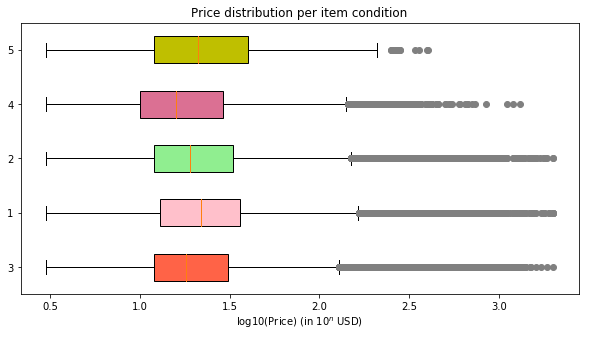

In [39]:
# BoxPlot per item_condition category
plt.figure(figsize=(10,5)) 

plt.title('Price distribution per item condition')
toPlot = [np.array(np.log10(data_mercari.price[data_mercari.item_condition_id==condition]))\
          for condition in data_mercari.item_condition_id.unique()]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,6),data_mercari.item_condition_id.unique())

colors = ['tomato','pink','lightgreen','palevioletred','y']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

But it would be a mistake to believe that `item_condition_id` has no impact on the price of the items sold. We take the example of the iPhone, and we see that the better condition the item is in, the greater the price.

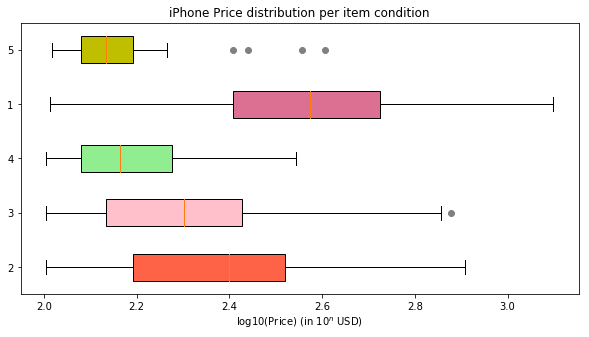

In [53]:
# We can select ± iPhone items by looking for item names containing 'iphone' which prices are greater than $100
def findIphone(string):
    return(string.lower().find('iphone')>=0)

mercari_iphone = data_mercari[data_mercari.name.map(findIphone)]
mercari_iphone = mercari_iphone[mercari_iphone.price>100]


# BoxPlot per item_condition
plt.figure(figsize=(10,5)) 

plt.title('iPhone Price distribution per item condition')
toPlot = [np.array(np.log10(mercari_iphone.price[mercari_iphone.item_condition_id==condition]))\
          for condition in mercari_iphone.item_condition_id.unique()]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,6),mercari_iphone.item_condition_id.unique())

colors = ['tomato','pink','lightgreen','palevioletred','y']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

# Analysing the `categories` variables

In [54]:
print("There are ", data_mercari.main_cat.nunique()," main categories.")
print("There are ", data_mercari.subcat_1.nunique()," sub-categories of level 1.")
print("There are ", data_mercari.subcat_2.nunique()," sub-categories of level 2.")

There are  10  main categories.
There are  104  sub-categories of level 1.
There are  670  sub-categories of level 2.


Let's visualize how data is distributed among the main categories, by plotting a pie chart and a treemap.
We see that more than half of the data is concentrated in the `Women` main category, followed by `Beauty`, `Kids` and `Men`. 

Text(0,0.5,'')

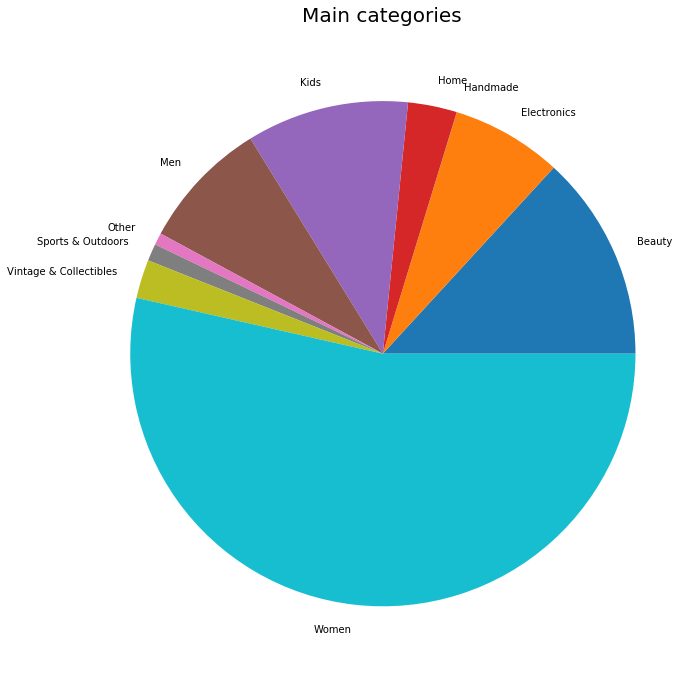

In [55]:
# Pie chart : 
plt.figure(figsize = (10,12))
data_mercari.name.groupby(data_mercari.main_cat).count().plot(kind = 'pie')
plt.title ('Main categories', fontsize = 20)
plt.axis('equal')
plt.ylabel('')
plt.show()

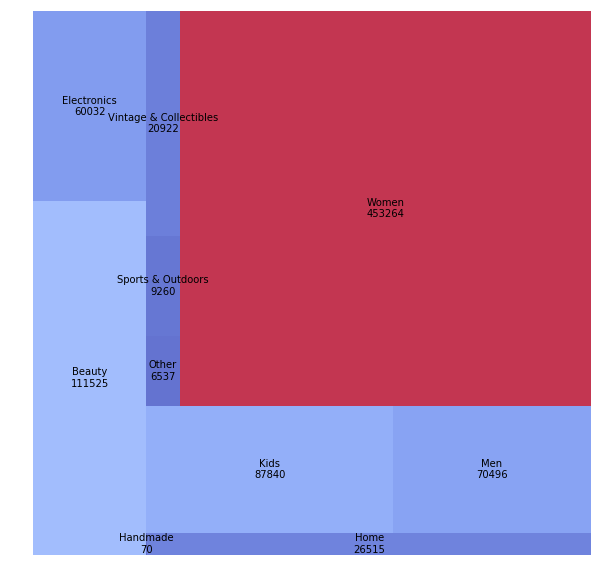

In [56]:
# Tree map : 
nb_items_main_cat = data_mercari.groupby('main_cat').agg('count')

# create a color palette, mapped to these values
mini=min(nb_items_main_cat.name)
maxi=max(nb_items_main_cat.name)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
cmap = matplotlib.cm.coolwarm
colors = [cmap(norm(value)) for value in nb_items_main_cat.name]

plt.figure(figsize=(10,10))
labels = ["%s\n%d" % (label) for label in zip(nb_items_main_cat.index, nb_items_main_cat.name)]
squarify.plot(sizes=nb_items_main_cat.name, label=labels, color=colors, alpha=.8)
plt.axis('off')
plt.show()

We will also use a TreeMap to see the distribution of data within the top 20 subcategories_1. As expected we see that most of these subcategories are fashion-related.

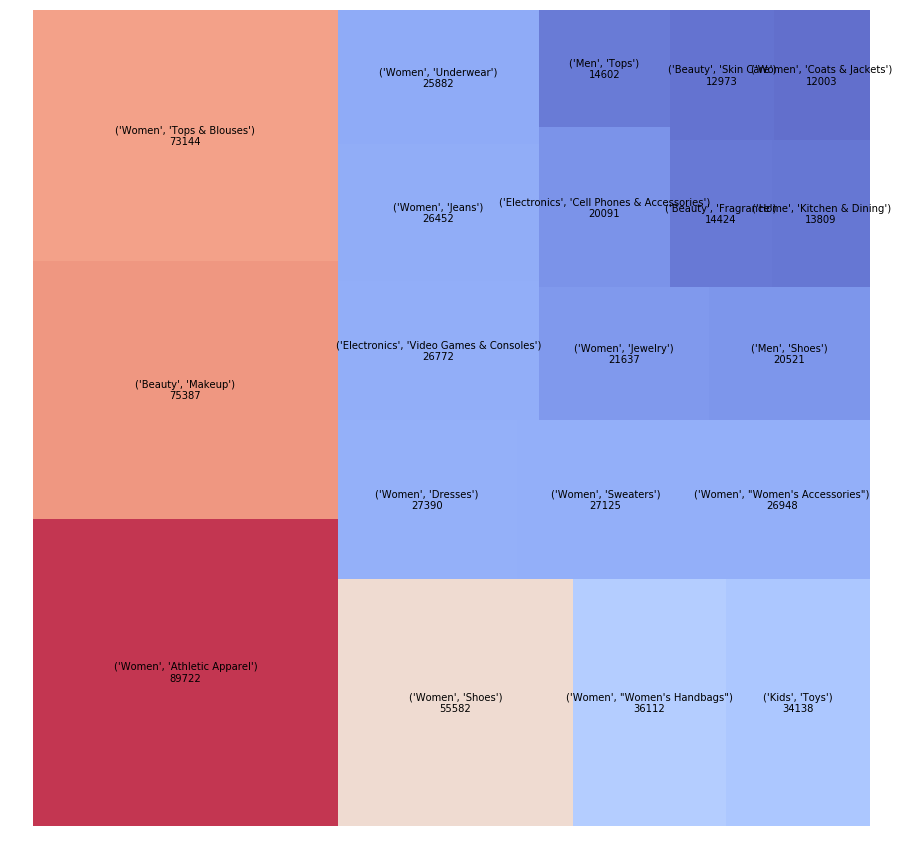

In [57]:
nb_items_subcat1 = data_mercari.groupby(('main_cat','subcat_1')).agg('count')

toPlot = nb_items_subcat1.sort_values('name', ascending=0).head(20)

mini=min(toPlot.name)
maxi=max(toPlot.name)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
cmap = matplotlib.cm.coolwarm
colors = [cmap(norm(value)) for value in toPlot.name]


labels = ["%s\n%d" % (label) for label in zip(toPlot.index, toPlot.name)]

plt.figure(figsize=(15,15))
squarify.plot(sizes=toPlot.name, label=labels, color=colors, alpha=.8)
plt.axis('off')

plt.show()

Let's analyse the influence of `main_cat` & `subcat_1` on `price` by plotting the boxplot of the repartition of `price` within these different categories.

We see that :
* categories are little correlated with the distribution of `log10(price)` as the boxplots are relatively similar.
* some categories have more outliers (i.e. luxury goods) than others

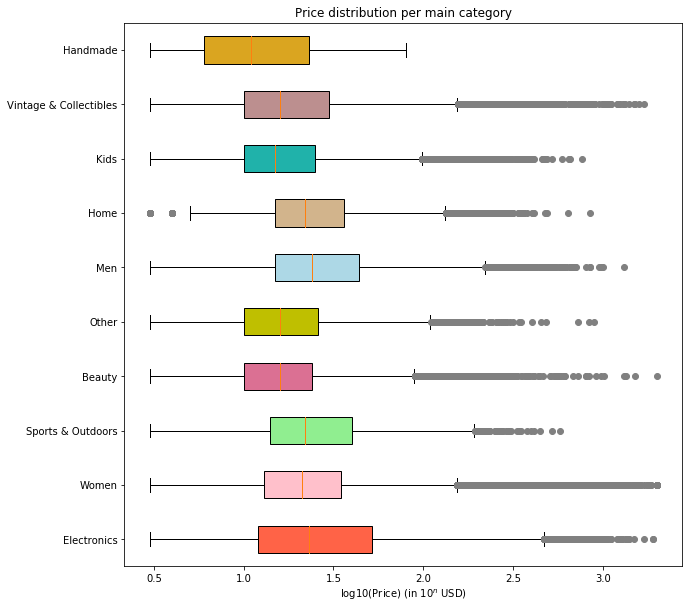

In [58]:
# BoxPlot per main category
plt.figure(figsize=(10,10)) 

plt.title('Price distribution per main category')
toPlot = [np.array(np.log10(data_mercari.price[data_mercari.main_cat==m])) for m in data_mercari.main_cat.unique()]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,11),data_mercari.main_cat.unique())

colors = ['tomato','pink','lightgreen','palevioletred','y','lightblue','tan','lightseagreen','rosybrown','goldenrod']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

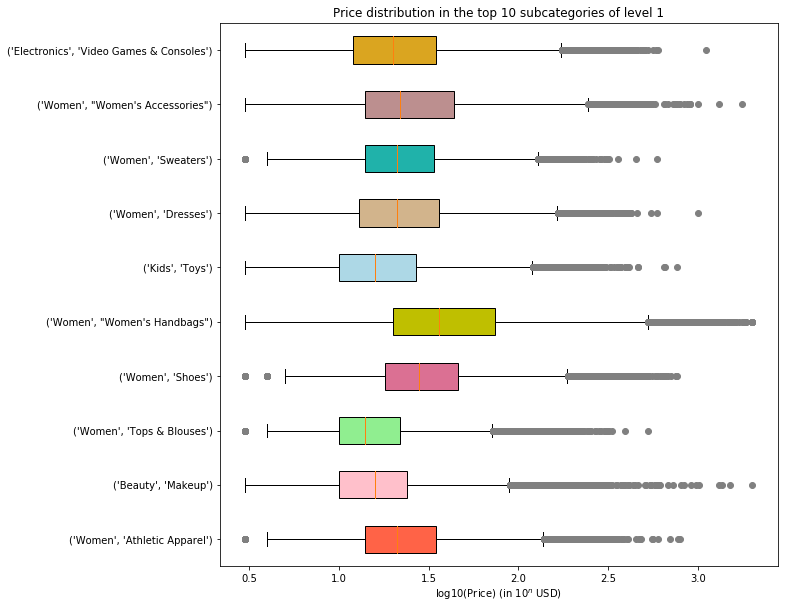

In [59]:
# BoxPlot per sub category of level 1 (top10 subcategories)

nb_items_subcat1 = data_mercari.groupby(('main_cat','subcat_1')).agg('count')
subcat_toPlot = nb_items_subcat1.sort_values('name', ascending=0).head(10).index


plt.figure(figsize=(10,10)) 

plt.title('Price distribution in the top 10 subcategories of level 1')
toPlot = [np.array(np.log10(data_mercari.price[data_mercari.main_cat==subcat_toPlot[i][0]][data_mercari.subcat_1==subcat_toPlot[i][1]]))\
          for i in range(10)]

bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,11),[subcat_toPlot[i] for i in range(10)])

colors = ['tomato','pink','lightgreen','palevioletred','y','lightblue','tan','lightseagreen','rosybrown','goldenrod']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

# Analysing the `brand_name` variable

In [60]:
print("There are %d unique brand names in the training dataset." % data_mercari['brand_name'].nunique())

There are 4789 unique brand names in the training dataset.


In [61]:
#
nb_items_brand = data_mercari.groupby('brand_name').agg('count')
print("The 30 brands with the largest number of items on store are: \n", \
      nb_items_brand.sort_values('name', ascending=0).head(30).index)

The 30 brands with the largest number of items on store are: 
 Index(['Nike', 'PINK', 'Victoria's Secret', 'LuLaRoe', 'Apple', 'FOREVER 21',
       'Nintendo', 'Lululemon', 'Michael Kors', 'American Eagle', 'Rae Dunn',
       'Sephora', 'Coach', 'Bath & Body Works', 'Disney', 'Adidas', 'Funko',
       'Under Armour', 'Sony', 'Old Navy', 'Hollister', 'Carter's',
       'Urban Decay', 'The North Face', 'Independent', 'Too Faced', 'Xbox',
       'Brandy Melville', 'Kate Spade', 'MAC'],
      dtype='object', name='brand_name')


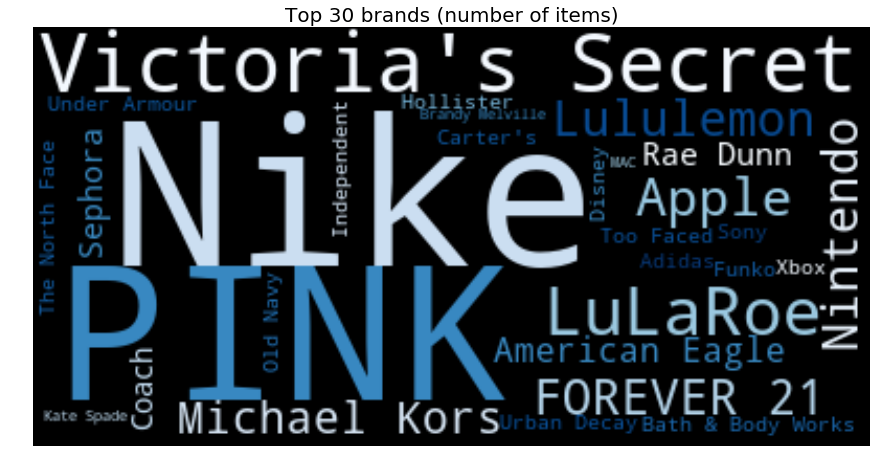

In [62]:
# For better visualization let's plot a WordCloud on the 30 brands with the largest number of items on store
# The size of each word corresponds to its frequency


# Computing the standardized frequency of each word
brand_freq = nb_items_brand.sort_values('name', ascending=0).head(30).name
brand_freq /= sum(brand_freq)
freq = brand_freq.to_dict()


w=WordCloud(colormap='Blues')
w.generate_from_frequencies(frequencies = freq)
plt.figure(figsize=(15,15))
plt.title('Top 30 brands (number of items)', fontsize = 20)
plt.axis('off')
plt.imshow(w, interpolation='bilinear')
plt.show()

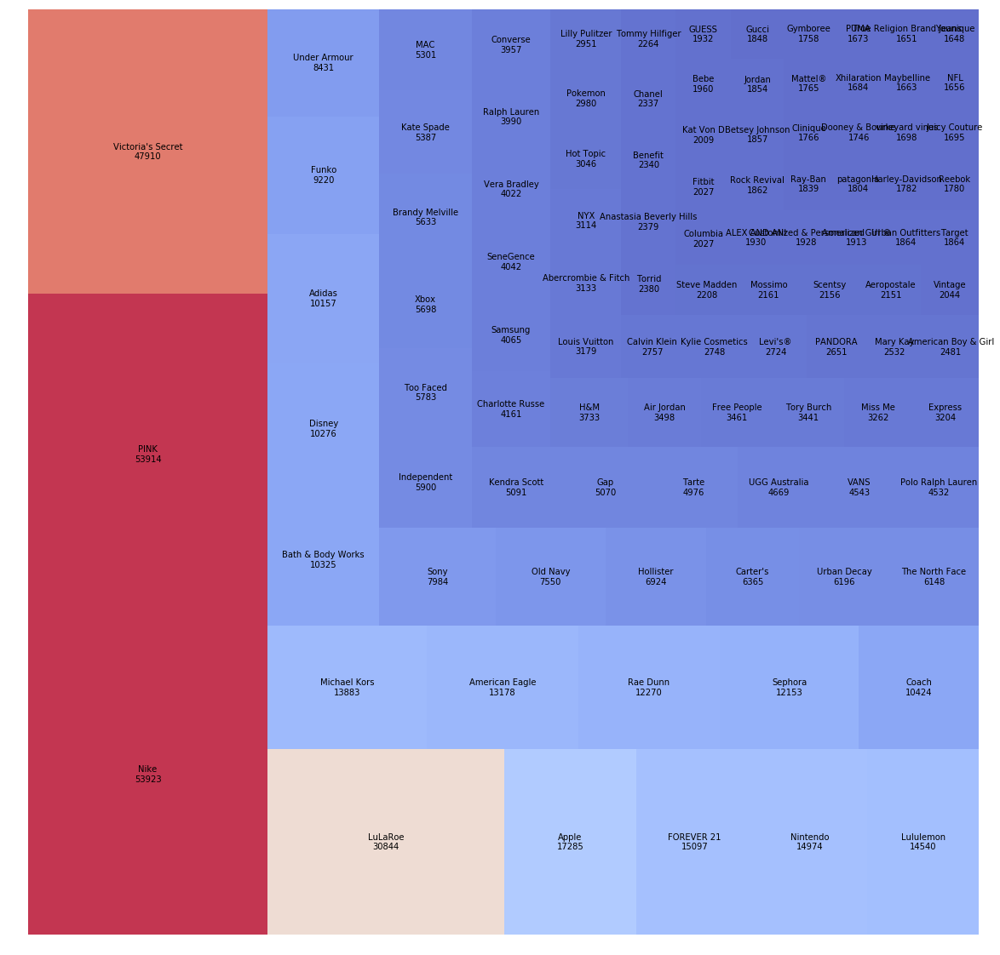

In [63]:
# Another visualisation for plotting more brands (100 brands) using a treemap

toPlot = nb_items_brand.sort_values('name', ascending=0).head(100)

mini=min(toPlot.name)
maxi=max(toPlot.name)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
cmap = matplotlib.cm.coolwarm
colors = [cmap(norm(value)) for value in toPlot.name]


labels = ["%s\n%d" % (label) for label in zip(toPlot.index, toPlot.name)]

plt.figure(figsize=(20,20))
squarify.plot(sizes=toPlot.name, label=labels, color=colors, alpha=.8)
plt.axis('off')

plt.show()

An important thing to do is to check if brand names are consistent : i.e. there is only **one** brand named **'Adidas'** and no 'Addidas', 'Addiddas', 'Adiddas', 'Adidass', etc.

Actually, this is the case with 'Adidas'.

In [64]:
#Check consistency of Brand names :
brand_names_array = np.sort(data_mercari.brand_name.unique())
Adidas_index = list(brand_names_array).index('Adidas')

brand_names_array[Adidas_index-4:Adidas_index+4]

array(['Adams Golf', 'Add Down', 'Addison', 'Adee Kaye', 'Adidas',
       'Adolfo', 'Adonna', 'Adora'], dtype=object)

However, even it seems that brand names are consistent in most cases, we sometimes spot errors on the go when exploring the dataset. For instance : **'Georgio Armani'** vs. **'Giorgio Armani'**.

There is two options : 
* either this is an error of some vendors on Mercari who mispelled the brand names,
* or it is due to counterfeit items sold on the website.

In [65]:
print(data_mercari[data_mercari.brand_name=='Georgio Armani'].price.describe(),'\n')
data_mercari[data_mercari.brand_name=='Georgio Armani'].head(10)

count    397.000000
mean      32.795970
std       49.319062
min        5.000000
25%       16.000000
50%       26.000000
75%       39.000000
max      917.000000
Name: price, dtype: float64 



,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description
252,Giorgio Armani Regenessence,1,Beauty,Makeup,Face,Georgio Armani,10.0,1,"Sample sized, never used Multi-firming rejuven..."
1123,GIORGIO ARMANI Sì Eau de Parfum,1,Beauty,Fragrance,Women,Georgio Armani,12.0,1,This listing is for: Brand New 0.24 oz GIORGIO...
10761,Emporio Armani,3,Beauty,Fragrance,Men,Georgio Armani,9.0,0,Black Jacket
13409,Georgia Armani Si,3,Beauty,Fragrance,Women,Georgio Armani,20.0,1,1 FL. OZ. Beautiful Georgio Armani Si parfum c...
16301,Giorgio Armani And MAC Bundle,2,Beauty,Makeup,Face,Georgio Armani,56.0,0,Amazing Giorgio Armani luminous silk foundatio...
18331,[rm] Acqua Di Gioia Jasmine. READ!!,1,Beauty,Fragrance,Women,Georgio Armani,22.0,1,More than half full. Bottle may have some scra...
26489,X3 giorgio armani etk mascara lot 2 ml,1,Beauty,Makeup,Eyes,Georgio Armani,14.0,1,Lot x 3 eyes to kill macara in shade black sam...
27675,Armani designer lift foundation,3,Beauty,Makeup,Face,Georgio Armani,36.0,0,Used a couple of times. Shade 3
27946,Acqua do gio for women 1.7 oz,1,Beauty,Fragrance,Women,Georgio Armani,32.0,0,Brand new 100% authentic sealed
29190,UNOPENED 1.7 Oz. Armani Sun di Gioia,1,Beauty,Fragrance,Women,Georgio Armani,50.0,1,"Unopened, brand new, still in packaging perfum..."


Prices seem to be coherent with the items sold, so there is a priori no issue of counterfeit goods. To deal with misspelling issues issue, we have 2 options :
* Rename all 'Georgio Armani' into 'Giorgio Armani' in order to ensure consistency within the whole data set. To do so we need to be able to automatically spot the misspelling errors in the dataset.
* Change nothing, with the idea that if the distibution of prices in 'Georgio Armani' items is the same as the distribution of prices in 'Giorgio Armani' items it will not change too much the quality of the `price` prediction we aim at performing.

Let's check the second option by plotting the boxplot of price distribution in Giorgio Armani vs. Georgio Armani.

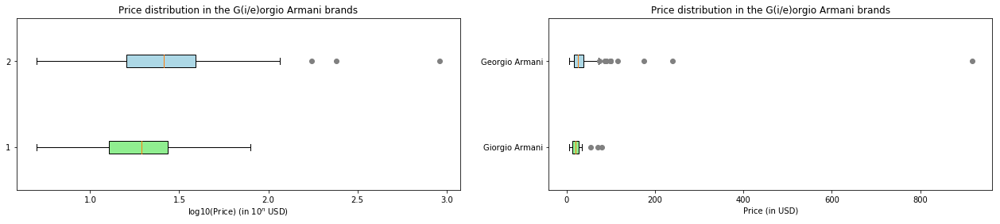

In [66]:
# Boxplot of price distribution in Giorgio Armani vs. Georgio Armani.

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(22,4))


# boxplot of log10(price)

axes[0].set_title('Price distribution in the G(i/e)orgio Armani brands')
brand_selection = ['Giorgio Armani','Georgio Armani']

toPlot1 = [np.array(np.log10(data_mercari.price[data_mercari.brand_name==bn])) for bn in brand_selection]
bplot1 = axes[0].boxplot(toPlot1, 0, 'grey', 0, patch_artist=True)
axes[0].set_xlabel('log10(Price) (in $10^n$ USD)')

colors = ['lightgreen','lightblue']
for patch, color in zip(bplot1['boxes'], colors):
    patch.set_facecolor(color)

    
# boxplot of Price

axes[1].set_title('Price distribution in the G(i/e)orgio Armani brands')
brand_selection = ['Giorgio Armani','Georgio Armani']

toPlot2 = [np.array(data_mercari.price[data_mercari.brand_name==bn]) for bn in brand_selection]
bplot2 = axes[1].boxplot(toPlot2, 0, 'grey', 0, patch_artist=True)
axes[1].set_xlabel('Price (in USD)')

colors = ['lightgreen','lightblue']
for patch, color in zip(bplot2['boxes'], colors):
    patch.set_facecolor(color)

plt.yticks(range(1,len(brand_selection)+1),brand_selection)

plt.show()

It does not seem to be too critical to keep 'Georgio Armani' items separated from 'Giorgio Armani' ones as the price distributions are roughly the same. Still, we see that in doing so we will not take into account the outliers (very expensive products) and consequently undermine the "luxury" characteristic of the brand. For this reason it is reasonable to merge these two brands in one.

As mentionned before, we only spotted the "Giorgio" vs. "Georgio" case on the go while exploring the dataset. We need to develop a method for finding these errors automatically or at least semi-automatically.

Our strategy to do so is to :
1. Compute distances between brand names thanks to an ad-hoc metric.
* For all brands with small distances check by hand if it is due to a mispelling error or not.
* Merge brands that need to be merged.

#### 1) Compute distances
The metric we use is the [Levenstein distance](https://en.wikipedia.org/wiki/Levenshtein_distance) : "Informally, the Levenshtein distance between two words is the minimum number of single-character edits (insertions, deletions or substitutions) required to change one word into the other" (`source : wikipedia`).
The Levenshtein distance between two words $a$ and $b$ is given by $lev_{a,b}(\lvert a \rvert,\lvert b \rvert)$ where :
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/f0a48ecfc9852c042382fdc33c19e11a16948e85"/>

The Levenshtein distance is accessible in the `nltk` (i.e. Natural Language Toolkit) package.

For performance reason, we think that it is time-consuming and useless to compute Levenshtein distances between all brand names which would recquire $\frac{4789 \times 4788}{2}$ computation of Levenshtein distances, each distance computation recquires $\Theta(\lvert word_i\rvert\times\lvert word_j\rvert)$ operations. So it can be very time consuming ...

To deal with this time-complexity, we sort brand names by asc. order and for each brand we compute its distance with its 100 predecessors and 100 successors. We assume that a 200-size-centered window is enough for spotting most of the misspelling errors - At least, as a sanity check, it enabled us to spot the Georgio / Giorgio error we previously mentionned.

In [174]:
#brand_names_array = np.sort(data_mercari.brand_name.unique())
m = np.mean(np.array(list(map(len,brand_names_array))))
print("In average, brand names are",m,"character-long" )

In average, brand names are 9.97962612896 character-long


In [359]:
#brand_names_array = np.sort(data_mercari.brand_name.unique())

# Compute a triangular matrix filled with Levensthein distance for brands
# The uncomputed distances are equal to Inf

N = len(brand_names_array)
brand_lev_distance = np.empty(shape=(N,N))
brand_lev_distance[:] = np.Inf
print("Start computing distances, it's going to take a few seconds ...")
for i in range(N):
    for j in range(i+1,i+100):
        if j<N:
            brand_lev_distance[i,j] = nltk.edit_distance(brand_names_array[i],brand_names_array[j])
print("Computing done. Thanks for waiting !")

# We save this computation in a .npy file in case we want to use it later on
np.save(arr=brand_lev_distance,file="brand_lev_distance")

Start computing distances, it's going to take a few seconds ...
Computing done. Thanks for waiting !


#### 2) Check (by hand) if similar brand names are actually similar because of a mispelling error or if it is "pure" coincidence.

We only consider very similar words with a distance = 1, and we write a small program to ask us if we want
* to merge
* not to merge
* or we have no idea about
two similar brands. The result is stored in a list that we save for future usage.


In [2]:
## ******** Don't run if not necessary: this needed a lot of handwork *********
## ******** You can skip this phase by running the following line ********* 
#  ******** brand_to_merge = np.load(brand_to_merge.npy) *********


# We will check brands with very similar names (Levenshtein distance =1)

brand_to_merge = []
brand_to_check = []

toTest = np.argwhere(brand_lev_distance==1)
for b in toTest :
    print(brand_names_array[b[0]],brand_names_array[b[1]])
    flag = eval(input("Do you want to merge these 2 brands? (0=No, 1=Yes, 2=Maybe)"))
    if (flag==1):
        brand_to_merge+=[(brand_names_array[b[0]],brand_names_array[b[1]])]
    if (flag==2):
        brand_to_check+=[(brand_names_array[b[0]],brand_names_array[b[1]])]

np.save(arr=brand_to_merge,file="brand_to_merge")
np.save(arr=brand_to_check,file="brand_to_check")

In [3]:
## ******** Don't run if not necessary: this needed a lot of handwork *********
## ******** You can skip this phase by running the following line ********* 
#  ******** brand_to_merge = np.load(brand_to_merge.npy) *********

# We check on Google if there is a misspelling
# We check if the items sold in Brand i and brand j are similar

for b in brand_to_check :
    print(data_mercari[data_mercari.brand_name==b[0]].head(1)[['name','main_cat','subcat_1','subcat_2','brand_name','price','item_description']])
    print()
    print(data_mercari[data_mercari.brand_name==b[1]].head(1)[['name','main_cat','subcat_1','subcat_2','brand_name','price','item_description']])
    print()
    flag = eval(input('Do you want to merge these 2 brands? (Yes=1, No=0)'))
    if flag==1:
        brand_to_merge += [b]

np.save(arr=brand_to_merge,file="brand_to_merge")

#### 3) Merge brands

Eventually the brands to merge are listed below. We then reorder them by hand for merging them more easily

In [9]:
#brand_to_merge = np.load(brand_to_merge.npy)
brand_to_merge

array([['All Saints', 'AllSaints'],
       ['B Darlin', 'B. Darlin'],
       ['Chan Luu', 'Chann Luu'],
       ['Chloe', 'Chloé'],
       ['Cover Girl', 'CoverGirl'],
       ['DKNY', 'DKNYC'],
       ['Earl Jean', 'Earl Jeans'],
       ['Georgio Armani', 'Giorgio Armani'],
       ['Hanna Anderson', 'Hanna Andersson'],
       ['Heart Soul', 'HeartSoul'],
       ['J. Crew', 'J.Crew'],
       ['Kipling', 'Kiplling'],
       ['Lancome', 'Lancôme'],
       ['Philips', 'Phillips'],
       ['Quicksilver', 'Quiksilver'],
       ['Ravebsburger', 'Ravensburger'],
       ['Safety 1st', 'Safety st'],
       ['Spin Master', 'Spin Masters'],
       ['Stussy', 'Stüssy'],
       ['Threads  Thought', 'Threads 4 Thought'],
       ['Universal Studios', 'Univsersal Studios'],
       ['AND', 'AND1'],
       ['Jordan', 'Jordans'],
       ['KR3W', 'KRW'],
       ['Rustler', 'Rustlers'],
       ['Silhouette', 'Silhouettes'],
       ['Sperry', 'Sperrys'],
       ['Stampd', 'Stamped']],
      dtype='<U18')

In [77]:
#put the brand to merge in the correct order
to_change=[0,1,3,6,7,8,9,10,12,14,15,18,19,20,21]

for i in to_change :
    brand_to_merge[i][0],brand_to_merge[i][1] = brand_to_merge[i][1],brand_to_merge[i][0]


In [79]:
# Merge brands
for b in brand_to_merge :
    data_mercari.brand_name.replace(b[1], b[0], inplace=True)

In [80]:
# Sanity check

b=['Giorgio Armani', 'Georgio Armani']
print('brand name = Georgio Armani')
print(data_mercari[data_mercari.brand_name == b[1]].brand_name.head(5))
print('vs.brand name = Giorgio Armani')
print(data_mercari[data_mercari.brand_name == b[0]].brand_name.head(5))

brand name = Georgio Armani
Series([], Name: brand_name, dtype: object)
vs.brand name = Giorgio Armani
252      Giorgio Armani
1123     Giorgio Armani
10761    Giorgio Armani
13409    Giorgio Armani
16301    Giorgio Armani
Name: brand_name, dtype: object


In [81]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned.pickle")

Now that we have cleaned the brand names, we can perform some analysis on the correlations between brands and price. For this purpose we plot the boxplot of price distribution in a selection of the following well-known brands : `['Nike','Adidas','LEGO','Apple', 'Samsung','Sephora','Tiffany & Co.','H&M',"Levi's®",'Louis Vuitton','Chanel']`.

We observe that brands (much more than categories) have a strong influence on the prices of the items.

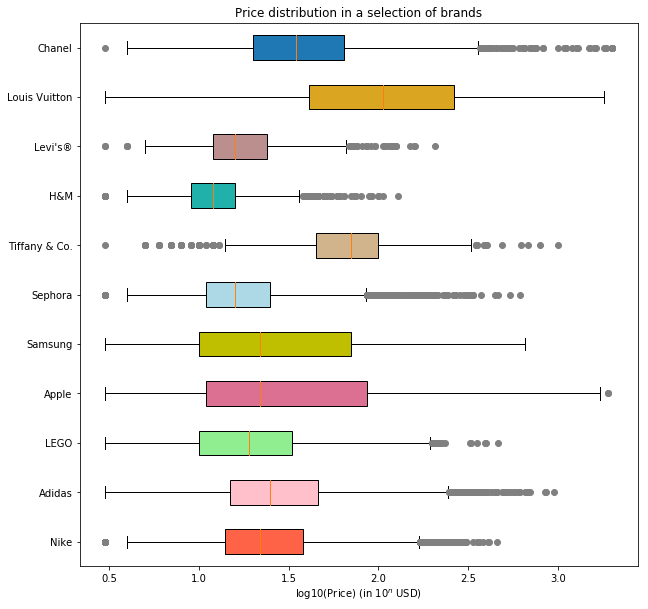

In [82]:
plt.figure(figsize=(10,10)) 

plt.title('Price distribution in a selection of brands')
brand_selection = ['Nike','Adidas','LEGO','Apple', 'Samsung','Sephora','Tiffany & Co.','H&M',"Levi's®",'Louis Vuitton','Chanel']
toPlot = [np.array(np.log10(data_mercari.price[data_mercari.brand_name==bn])) for bn in brand_selection]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,len(brand_selection)+1),brand_selection)

colors = ['tomato','pink','lightgreen','palevioletred','y','lightblue','tan','lightseagreen','rosybrown','goldenrod']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

# Analysing the `name` variable

/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:3110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


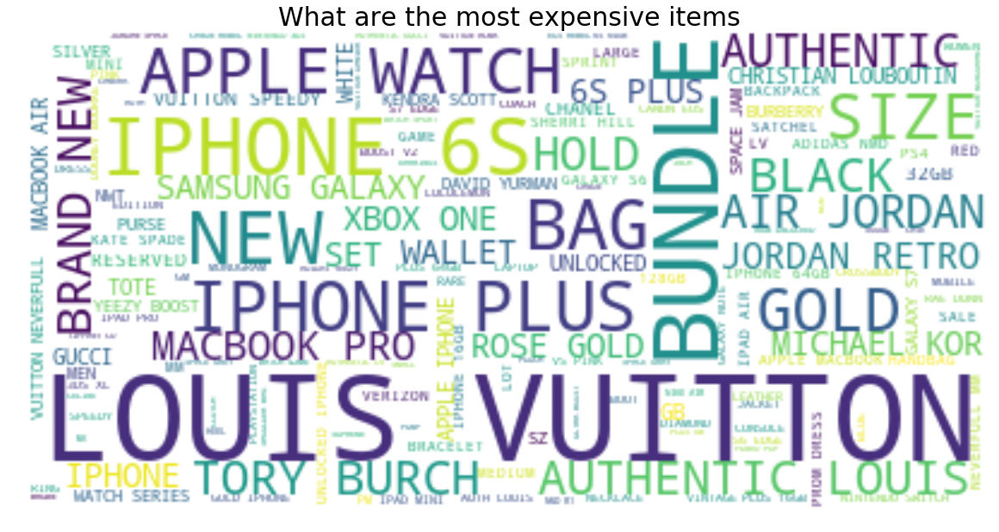

In [83]:
#Most expensive items
exp = data_mercari[data_mercari['price'] > 200]
exp.name = exp.name.str.upper()

wc = WordCloud(background_color="white", max_words=5000, max_font_size= 50)

wc.generate(" ".join(str(s) for s in exp.name.values))

plt.figure(figsize=(20,12))
plt.title('What are the most expensive items', fontsize = 30)
plt.axis('off')
plt.imshow(wc, interpolation='bilinear')

# Analysing the `item_description` variable

We based our NLP study on this [tutorial](https://www.analyticsvidhya.com/blog/2017/01/ultimate-guide-to-understand-implement-natural-language-processing-codes-in-python/)

### Cleaning and tokenizing the `item_description`

Let's first have a look at the most common words used in the `item_description` variable.
We observe that:
 * it contains a lot of generic descriptions ("brand new","good condition", "great condition")
 * even if shipping fees are indicated in some dedicated variable, it very often appears in the description.
 * highlighting the brand seems to be quite important for sellers since "Victoria Secret", "PINK", "Rae Dunn" often appears
 * funnily enough, some features linked to the previous"life" of items are of very high importance ("smoke free", "no pet").

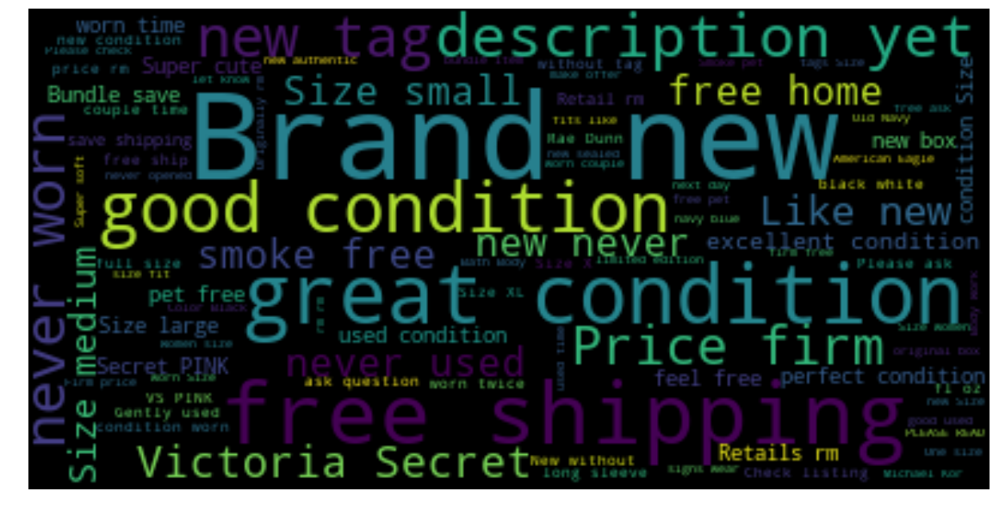

In [15]:
##### If needed, download the english stopwords collection by uncommenting next line ######
#nltk.download("stopwords")

wc = WordCloud(background_color="black", max_words=500, 
               stopwords=nltk.corpus.stopwords.words('english'), max_font_size= 50)

wc.generate(" ".join(str(s) for s in data_mercari.item_description.values))

plt.figure(figsize=(20,12))
plt.axis('off')
plt.imshow(wc, interpolation='bilinear')
plt.show()

In [90]:
# For easier access to description, we reindex the DataFrame
data_mercari['reindex']=range(1,data_mercari.shape[0]+1)
data_mercari.set_index('reindex',inplace=True)

The main challenge of this dataset is to deal with the items description which represent unstructured data. The difficulty here lies in the fact that the way products are described is not standardized at all! There is as many description styles as there are vendors on Mercari. Let's have a look on some description styles we spotted on the go.

In [85]:
print('*** Some vendors indicate the price in the description - which was removed for this challenge, see the [rm] ***')
print(data_mercari.item_description.iloc[5])
print('\n')
print('*** Some vendors talk about themselves rather than the products and use emojis ***')
print(data_mercari.item_description.iloc[17])
print('\n')
print('*** Some vendors only mention the products characteristics ***')
print(data_mercari.item_description.iloc[21])
print('\n')
print('*** Some vendors use special characters for appealing the buyers ***')
print(data_mercari.item_description.iloc[846455])

*** Some vendors indicate the price in the description - which was removed for this challenge, see the [rm] ***
0.25 oz Full size is 1oz for [rm] in Sephora


*** Some vendors talk about themselves rather than the products and use emojis ***
lanascloset ~~~ description: never worn! ✨ i delete/update my listings and relist them so like my “sold” listings to have easier access to my shop later on ~~~ ✨ i normally ship the following day, but it happens that i ship a few days after purchase ~~~ forever 21 brandy Melville baseball tee


*** Some vendors only mention the products characteristics ***
Beautiful Excellent condition Zips and ties in the back Cream liner top to bottom


*** Some vendors use special characters for appealing the buyers ***
▪️NWOT ▪️Perfect Condition ▪️Barely been worn ▪️No flaws ▪️Not Nike from Stadium Athletics ▪️No pockets, great for leisure wear


We will need to structure this data for having the more insights as possible. A classical basic approach consists in removing all the "noise" within text to only keep words that describe best the items. For instance 

    "This AUTHENTIC pallete by Too Faced is brand new in mint condition still in original box. It\'s part of the. Christmas 2016 collection. It has 12 pretty eye shadow colors and a small sized"Better Than Sex" mascara. Never even swatched. Impeccable shape. Price includes 2 day priority shipping with insurance."

will turn in

    "authentic pallete too faced brand new mint condition original box part christmas 2016 collection 12 pretty eye shadow colors small sized better than sex mascara never even swatched impeccable shape price includes 2 day priority shipping insurance"


The steps will be

1. Remove all special characters (emojis, shapes ...), lower case, remove punctuation.
2. Remove stop words (i.e. very common words in english) such as 'i', 'it', 'what', 'is', etc. One challenging aspect regarding stop words is not to delete the negation words such as 'not', 'no', 'never', etc. which completely chang the meaning of a sentence : `'Not worn shirt'` ≠ `'worn shirt'`
3. Tokenize the description i.e. put it in a list of words. This can be a critical part: Should we separate all words? Keep some of them together (like 'Not worn' instead of 'not','worn' or '12 oz' instead of '12','oz' ...)
4. Continue the processing with other steps we will mention later on.

In [86]:
# We need to remove the '[rm]'s in item_description.

# First, let's have some basic statistics about the use of price within item_description:

def findRm(string):
    return(string.find('[rm]')>=0)

percentage_rm = sum(data_mercari.item_description.map(findRm))/data_mercari.shape[0]*100
print("There is ", round(percentage_rm), "% of the item descriptions containing Price indications")



There is  9.0 % of the item descriptions containing Price indications


In [5]:
# Then let's remove them
def replaceRm(string):
    return(string.replace(' [rm]',''))

data_mercari['item_description_token'] = data_mercari.item_description.map(replaceRm)

In [7]:
# Lower case, remove special characters, remove punctuation ... but keep decimal separator in decimal numbers (0.25)
string_to_modify = data_mercari.item_description.iloc[5]+'. '
print("Initial description:\n",string_to_modify)
print("Cleaned description:\n", \
      re.sub('[^A-Za-z0-9.]+|(?<!\d)\.(?!\d)',' ', string_to_modify).lower(),'\n')


def lowerCaseRemoveSpecial(string):
    return(re.sub('[^A-Za-z0-9.]+|(?<!\d)\.(?!\d)',' ', string).lower())

print('Please wait a couple seconds, we are processing the item_description ...')
data_mercari.item_description_token = data_mercari.item_description_token.map(lowerCaseRemoveSpecial)
print('We are done. Thanks for having waited.')


Initial description:
 0.25 oz Full size is 1oz for [rm] in Sephora. 
Cleaned description:
 0.25 oz full size is 1oz for rm in sephora   

Please wait a couple seconds, we are processing the item_description ...
We are done. Thanks for having waited.


In [8]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned.pickle")

In order to remove the stopwords we will use the collection of the english stopwords provided in the nltk library. Furthermore, it seems to be quite inefficient to remove stop words directly in a string, the best solution is to tokenize the descriptions, then to remove stopwords.

**⚠ you will probably need to download some features for `nltk` :**
* **`nltk.download("stopwords")`**
* **`nltk.download("punkt")`**

To do so, just uncomment the first lines of code of the next chunks. Thanks.


In [9]:
##### If needed, download the english stopwords collection by uncommenting next line ######
#nltk.download("stopwords")

# Let's have a look at this collection:
print(nltk.corpus.stopwords.words('english'))
print('\n')

# As mentionned previously, we will keep the 'no' and 'not' words in order no to bias a description 
#("Not worn shirt" ≠ "Worn shirt")

print("Number of stopwords in the collection:", len(nltk.corpus.stopwords.words('english')),'\n')

stopwords = nltk.corpus.stopwords.words('english')
stopwords.remove('no')
stopwords.remove('not')
print("Number of stopwords in the collection (we removed 'no' & 'not'):", len(stopwords))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [10]:
##### If needed, download the text tokenizer by uncommenting next line ######
#nltk.download("punkt")

print("Please wait while we're tokenizing the item_description. It's going to take a few seconds ...")
data_mercari.item_description_token = data_mercari.item_description_token.map(nltk.word_tokenize)
print("Tokenization done! Thanks for having waited.")

Please wait while we're tokenizing the item_description. It's going to take a few seconds ...
Tokenization done! Thanks for having waited.


In [11]:
# Now let's remove the stopwords in the tokenized item_description

print('*** Unfiltered tokenized item description ***')
print(data_mercari.item_description_token.iloc[1])
print('\n')
print('*** Filtered tokenized item description ***')
filtered_token = [w for w in data_mercari.item_description_token.iloc[1] if not w in stopwords]
print(filtered_token)
print('\n')

def filterStopWords(token):
    return([w for w in token if not w in stopwords])

print("Please wait while we're filtering the tokenized item_description. It's going to take a few seconds ...")
data_mercari.item_description_token = data_mercari.item_description_token.map(filterStopWords)
print("Tokenization done! Thanks for having waited.")


*** Unfiltered tokenized item description ***
['adorable', 'top', 'with', 'a', 'hint', 'of', 'lace', 'and', 'a', 'key', 'hole', 'in', 'the', 'back', 'the', 'pale', 'pink', 'is', 'a', '1x', 'and', 'i', 'also', 'have', 'a', '3x', 'available', 'in', 'white']


*** Filtered tokenized item description ***
['adorable', 'top', 'hint', 'lace', 'key', 'hole', 'back', 'pale', 'pink', '1x', 'also', '3x', 'available', 'white']


Please wait while we're filtering the tokenized item_description. It's going to take a few seconds ...
Tokenization done! Thanks for having waited.


In [13]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned_tokenizedNoStopWord.pickle")

For the moment we keep tokens as they currently are. The main challenges for being able to predict prices given a description will be :
* to understand, learn and extract quantities and other quantitative features : this item `['0.5', 'oz', 'full', 'size', '1oz', 'sephora']` is probably $2\times$ more expensive than this one `['0.25', 'oz', 'full', 'size', '1oz', 'sephora']`
* to understand and learn that `['barely', 'worn']`, `['worn', 'one', 'time', 'excellent', 'condition']` and `['not','worn']` are ± equivalent.

In order to structure the data, we will tokenize item names as well.

In [18]:
# Remove [rm] prices in name
print('Please wait a couple seconds, we are removing [rm] in the item names ...')
data_mercari['name_token'] = data_mercari.name.map(replaceRm)
print('We are done. Thanks for having waited.')

print('\n')

# Lower case, remove special characters, remove punctuation ... but keep decimal separator in decimal numbers (0.25)
print('Please wait a couple seconds, we are removing special characters in the item names ...')
data_mercari.name_token = data_mercari.name_token.map(lowerCaseRemoveSpecial)
print('We are done. Thanks for having waited.')

print('\n')

# Tokenize name
print("Please wait while we're tokenizing the item names. It's going to take a few seconds ...")
data_mercari.name_token = data_mercari.name_token.map(nltk.word_tokenize)
print("Tokenization done! Thanks for having waited.")

print('\n')

# Remove the stopwords in the tokenized item names
print("Please wait while we're filtering the tokenized item names. It's going to take a few seconds ...")
data_mercari.name_token = data_mercari.name_token.map(filterStopWords)
print("Tokenization done! Thanks for having waited.")


Please wait a couple seconds, we are removing [rm] in the item names ...
We are done. Thanks for having waited.


Please wait a couple seconds, we are removing special characters in the item names ...
We are done. Thanks for having waited.


Please wait while we're tokenizing the item names. It's going to take a few seconds ...
Tokenization done! Thanks for having waited.


Please wait while we're filtering the tokenized item names. It's going to take a few seconds ...
Tokenization done! Thanks for having waited.


In [21]:
data_mercari.head(4)

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description,item_description_token,name_token
1,Razer BlackWidow Chroma Keyboard,3,Electronics,Computers & Tablets,Components & Parts,Razer,52.0,0,This keyboard is in great condition and works ...,"[keyboard, great, condition, works, like, came...","[razer, blackwidow, chroma, keyboard]"
2,AVA-VIV Blouse,1,Women,Tops & Blouses,Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,"[adorable, top, hint, lace, key, hole, back, p...","[ava, viv, blouse]"
6,Acacia pacific tides santorini top,3,Women,Swimwear,Two-Piece,Acacia Swimwear,64.0,0,Size small but straps slightly shortened to fi...,"[size, small, straps, slightly, shortened, fit...","[acacia, pacific, tides, santorini, top]"
7,Girls cheer and tumbling bundle of 7,3,Sports & Outdoors,Apparel,Girls,Soffe,6.0,1,You get three pairs of Sophie cheer shorts siz...,"[get, three, pairs, sophie, cheer, shorts, siz...","[girls, cheer, tumbling, bundle, 7]"


In [22]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned_tokenizedNoStopWord_tokenizedName.pickle")

We will continue further on the denoising of data by performing **lematization** over the tokens. Indeed another type of textual noise is about the multiple representations exhibited by single word. For example 'buy', 'bought', 'buys', 'buying', etc. are the different variations of the word 'buy'. They may be syntaxically different but are semantically similar. With lematization we will reduce the disparities of a word into its normalized form (also known as **lemma**).

To do so we will use the `lemmatize` method from the `nltk` library.

In [8]:
##### Let's play with the lemmatize method from nltk ######
##### If needed, download the wordnet package by uncommenting next line ######
#nltk.download('wordnet')

to_lemmatize = ["shipping", "plays", "bought", "boys", "women", "better"]

def lemmatizeVerb(string):
    return(nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string,"v"))

# NB : we use a for loop instead of np.vectorize because even if it needs more time to compute,nltk.word_tonkenize
# uses an optimized way for storing information and the file is therefore lighter than when using a np.array
def lemmatizeVerbVect(sequence):
    for i in range(len(sequence)):
        sequence[i] = lemmatizeVerb(sequence[i])
    return(sequence)



def lemmatizeAdj(string):
    return(nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string,"a"))

def lemmatizeAdjVect(sequence):
    for i in range(len(sequence)):
        sequence[i] = lemmatizeAdj(sequence[i])
    return(sequence)



def lemmatizeNoun(string):
    return(nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string))
lemmatizeNounVect=np.vectorize(lemmatizeNoun, otypes=[str])

def lemmatizeNounVect(sequence):
    for i in range(len(sequence)):
        sequence[i] = lemmatizeNoun(sequence[i])
    return(sequence)


print("These are the words to lemmatize (verbs, nouns, adjectives):")
print(to_lemmatize)
print("\n")
print("Lemmatize verbs:")
print(lemmatizeVerbVect(to_lemmatize))
print("\n")
print("Lemmatize adjectivess:")
print(lemmatizeAdjVect(to_lemmatize))
print("\n")
print("Lemmatize nouns:")
print(lemmatizeNounVect(to_lemmatize))
print("\n")

These are the words to lemmatize (verbs, nouns, adjectives):
['shipping', 'plays', 'bought', 'boys', 'women', 'better']


Lemmatize verbs:
['ship', 'play', 'buy', 'boys', 'women', 'better']


Lemmatize adjectivess:
['ship', 'play', 'buy', 'boys', 'women', 'good']


Lemmatize nouns:
['ship', 'play', 'buy', 'boy', 'woman', 'good']




In [9]:
# Lemmatize the item_description tokens
print("We are lemmatizing verbs inside the item_description tokens. Please wait a few seconds...")
data_mercari.item_description_token = data_mercari.item_description_token.map(lemmatizeVerbVect)
print("Verbs lemmatization done. Thanks for having waited!")

print("\n")

print("We are lemmatizing adjectives inside the item_description tokens. Please wait a few seconds...")
data_mercari.item_description_token = data_mercari.item_description_token.map(lemmatizeAdjVect)
print("Adjectives lemmatization done. Thanks for having waited!")

print("\n")

print("We are lemmatizing adjectives inside the item_description tokens. Please wait a few seconds...")
data_mercari.item_description_token = data_mercari.item_description_token.map(lemmatizeNounVect)
print("Nouns lemmatization done. Thanks for having waited!")

We are lemmatizing verbs inside the item_description tokens. Please wait a few seconds...
Verbs lemmatization done. Thanks for having waited!


We are lemmatizing adjectives inside the item_description tokens. Please wait a few seconds...
Adjectives lemmatization done. Thanks for having waited!


We are lemmatizing adjectives inside the item_description tokens. Please wait a few seconds...
Nouns lemmatization done. Thanks for having waited!


In [50]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned_tokenizedNoStopWord_tokenizedName_LemmatizeDescription.pickle")

While still denoizing the data, we spot some tokens with strings of `length = 1` (we're talking about 1-character tokens not about 1-number tokens). As we cannot understand them, we will remove them

In [51]:
print("*** Some examples of 1-character tokens spotted on the go: ***\n")
print(data_mercari.item_description_token.iloc[2])
print(data_mercari.item_description_token.iloc[6])

*** Some examples of 1-character tokens spotted on the go: ***

['size', 'small', 'strap', 'slightly', 'shorten', 'fit', 'x', 'besides', 'perfect', 'condition']
['5', 'new', 'v', 'pink', 'body', 'mist', '2.5', 'oz', 'fresh', 'clean', 'sun', 'kiss', 'cool', 'bright', 'total', 'flirt', 'sweet', 'flirty']


In [53]:
def removeOneCharacterToken(sequence):
    for token in sequence :
        if len(token)==1 and token.isalpha() :
            sequence.remove(token)
    return(sequence)

In [54]:
# Now we use these functions for filtering 1-character tokens from the item-description

print("We are filtering 1-character tokens from the item-description. Please wait a few seconds...")
data_mercari.item_description_token = data_mercari.item_description_token.map(removeOneCharacterToken)
print("Filtering done. Thanks for having waited!")

We are filtering 1-character tokens from the item-description. Please wait a few seconds...
Filtering done. Thanks for having waited!


In [55]:
# Save data in a pickle file
data_mercari.to_pickle("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned_tokenizedNoStopWord_tokenizedName_LemmatizeDescription_1CharacterFiltered.pickle")

### First insights on the `item_description`

Let's see if the length of `item_description` as any impact on `price`. Indeed, as a buyer we would have more trust in an item with a consequent description rather than an item with no description, and therefore be willing to pay more for it.

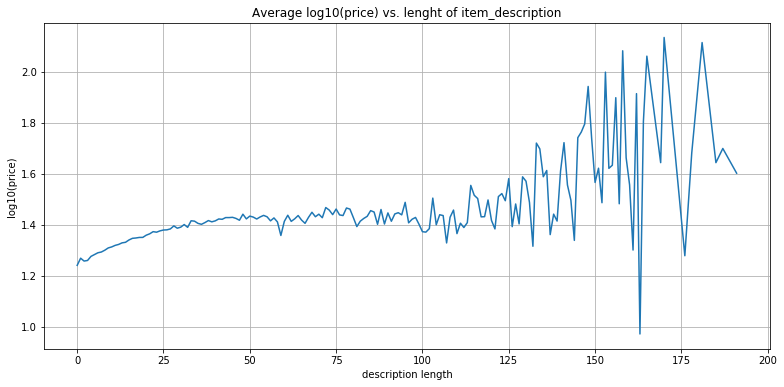

In [15]:
# Plot mean(log10(price)) vs. len(item_description)
x = np.array(data_mercari.item_description_token.map(len))
y = np.array(data_mercari.price.map(np.log10))

df_toPlot = pd.DataFrame({'length_description':x, 'log10_price':y})
y = np.array(df_toPlot.groupby('length_description').agg('mean').log10_price)
x = np.unique(x)

plt.figure(figsize=(13,6)) 
plt.title('Average log10(price) vs. lenght of item_description')
plt.ylabel('log10(price)')
plt.xlabel('description length')
plt.plot(x,y)
plt.grid()
plt.show()

### Bag-of-word model and TFIDF computation

### The bag-of-word model

In order to perform some analysis over the `item_description` we adopt the simple (and standard) **bag-of-words** representation. In this model, a text (such as an item description) is represented as the bag (multiset) of its words, disregarding grammar and even word order but keeping multiplicity. 

We extract the frequency of occurrence (or at least a more or less similar metric) of each word in the corpus as a feature for further analysis.

The benefits of this representation is that it is very simple to set up, yet its main drawback is that it is not very powerful, for instance it will not necessarily help us capture features such as "0.16oz" vs. "0.32oz" or  such as "not worn" vs. "never worn".

### Term-Frequency Inverse-Document-Frequency metric

**TF-IDF** is a weighted model commonly used for information retrieval in text mining. Its aim is to convert text documents into vectors based on the occurrence of words in these documents. It does not take into account the exact ordering of elements (only occurences are considered).

* **TF** means *Term Frequency*: it accounts for the frequency of occurence of a given word $w$ inside a given document $d$. A classical way (*actually this is the way the library we will use does*) of computing it is to use the raw frequency of $w$ in $d$ :

    $\mathrm{tf}(w,d) = \frac{\lvert\{w\in d\}\rvert}{\lvert\{w'\in d\}\rvert}$

* **IDF** means *Inverse Document Frequency*: it accounts for the **inverse**-frequency of occurence of a given word $w$ within the whole corpus of documents $D$. The aim of using inverse-frequency is to scale down the impact of words that occur very frequently in a given corpus and therefore deliver less information about a given document. A classical way (*actually this is the way the library we will use does*) of computing it is to use :

    $\mathrm{idf}(w,D) = \log\left( \frac{1 + \lvert D\rvert}{1 + \lvert\{ d\in D\ :\ t\in d\}\rvert} \right) + 1 $

* At the end of the day, we obtain the **TF-IDF** statistic as the following matrix:

    $(\mathrm{tfidf}(w,d))_{w,d} = \mathrm{tf}(w,d)\times \mathrm{idf}(w,D)$



"The tf-idf value increases proportionally to the number of times a word appears in the document, but is often offset by the frequency of the word in the corpus, which helps to adjust for the fact that some words appear more frequently in general. Nowadays, tf-idf is one of the most popular term-weighting schemes; **83% of text-based recommender systems in the domain of digital libraries use tf-idf**" (source : [Wikipedia](https://en.wikipedia.org/wiki/Tf%E2%80%93idf))

To implement it in Python, we use the `TfidfVectorizer` class from the library `scikit-learn`. The way we do it is the following :
* Create a new instance of the `TfidfVectorizer` class, and we pass it our recently created tokens via a method called `fit_transform` which computes the TFIDF matrix.
* `fit_transform` creates a vocabulary dictionnary (`vocabulary_`) which is used for mapping words (tokens) and vectors, and computes the TFIDF matrix. Each row `i` of the matrix corresponds to a document (here an `item_description`) and each column `j` corresponds to a word from the **whole** dictionnary of words. Each entry of the matrix hence corresponds to $(\mathrm{tfidf}(\mathrm{word_j,\ doc_i}))_{i,j}$.

As you may expect this matrix contains a lot of zeros that are useless, but still memory-consuming, as represented in the following image :

<img src="http://www.jiem.org/index.php/jiem/article/viewFile/293/252/2402"/>
(*NB: to stay consistent with our notation this matrix has to be transposed and renormalized*)



To deal with this issue of useless 0's, `fit_transform` uses `scipy.sparse` matrix for stocking information efficiently. To make it short, only $\{\left(i,\ j,\ \mathrm{tfidf}(\mathrm{word_j,\ doc_i})\right) :\ \mathrm{tfidf}(\mathrm{word_j,\ doc_i}) \ne 0\}$ are stored in memory.

In [5]:
#from sklearn.feature_extraction.text import TfidfVectorizer

item_description_tokens = data_mercari.item_description_token

# Initialize a new instance of TfidfVectorizer
# The parameters passed are such that we will be able to directly pass our preprocessed tokens instead of raw text
TFIDF = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=lambda x: x,
      tokenizer=lambda key: item_description_tokens[key])

print('We are computing the TFIDF of the data set, please wait a few seconds ...')
# Compute the TFIDF matrix (+create a dictionnary ...)
item_description_tokens_tfidf = TFIDF.fit_transform(item_description_tokens.keys())
print('TFIDF computed, thanks for having waited!')

We are computing the TFIDF of the data set, please wait a few seconds ...
TFIDF computed, thanks for having waited!


The TDIDF dictionnary created looks like this :

    TFIDF.vocabulary_ = {'keyboard': 53600,'great': 45914,'condition': 31815,'work': 94184, ...}

keys are word-tokens and values are associated column numbers in the TFIDF matrix. A very easy operation is to look for a column number given a token ... the less easy operation is to look for a token given a column number. In order to perform this operation we define a function called `getWord(search_column)`.

In [113]:
def getWord(search_column) :
    for word, value in TFIDF.vocabulary_.items():
        if value == search_column:
            search_word = word
            break
    return(search_word)

In [16]:
# Let's have a look at the result of the TFIDF computation:
print("**** This is the first row of the TFIDF matrix only non-zero elements are represented: ****\n",item_description_tokens_tfidf[0])
print("\n**** The corresponding words (i.e. tokens) are: ****\n ",TFIDF.inverse_transform(item_description_tokens_tfidf[0]))

**** This is the first row of the TFIDF matrix only non-zero elements are represented: ****
   (0, 53600)	0.280381749806
  (0, 45914)	0.109001455863
  (0, 31815)	0.0851358665555
  (0, 94184)	0.288467156744
  (0, 56241)	0.119154495838
  (0, 31431)	0.125149595061
  (0, 26070)	0.121943436485
  (0, 71251)	0.262569293421
  (0, 86499)	0.20079904627
  (0, 69119)	0.20468444387
  (0, 56129)	0.146338517108
  (0, 33751)	0.329009647475
  (0, 91449)	0.233826622955
  (0, 73884)	0.363122814311
  (0, 85251)	0.432018500476
  (0, 20636)	0.245852433691
  (0, 68735)	0.244694769216

**** The corresponding words (i.e. tokens) are: ****
  [array(['keyboard', 'great', 'condition', 'work', 'like', 'come', 'box',
       'port', 'test', 'perfectly', 'light', 'customizable', 'via',
       'razer', 'synapse', 'app', 'pc'],
      dtype='<U88')]


In [46]:
# Let's have a look at the columns of the TFIDF matrix:
print("The value associated to the word : 'keyboard' is 53600\n")
print("This is the tfidf('keyboard', d) for all documents d where 'keyboard' appears\n",\
      item_description_tokens_tfidf[:,53600][0:10000],'\n                 [...]')
print("\n")
N = np.argmax(item_description_tokens_tfidf[:,53600])
print("The maximum tfidf score of 'keyboard' is",np.max(item_description_tokens_tfidf[:,53600]),\
      " which is reached in line",N)
print("The item sold is '",data_mercari.name.iloc[N],"' and its description is '",\
      data_mercari.item_description.iloc[N],"'")

The value associated to the word : 'keyboard' is 53600

This is the tfidf('keyboard', d) for all documents d where 'keyboard' appears
   (0, 0)	0.280381749806
  (2283, 0)	0.23822132602
  (2438, 0)	0.225367799328
  (3259, 0)	0.319298339799
  (3940, 0)	0.365653370102
  (4524, 0)	0.0763912919324
  (6346, 0)	0.119679945477
  (6842, 0)	0.13077371206
  (7212, 0)	0.0677686320543
  (8336, 0)	0.518700168969 
                 [...]


The maximum tfidf score of 'keyboard' is 0.829164149573  which is reached in line 263962
The item sold is ' Logitech iPad mini keyboard ' and its description is ' Brand new keyboard! Never used! '


As a **sanity check** having such a high `tfidf` score for `tfidf('keyboard', 'Brand new keyboard! Never used!')` is not surprising since `'keyboard'` has for frequency in $\mathrm{tf}=\frac{1}{5}$ in the description (which is pretty high). Thus the high `tfidf`score.

Another **sanity check** is to look for tokens with highest and lowest `tfidf` scores. We observe that 
* one of the least significant words is `'size'` (which indeed appears very often in the description)
* one of the most significant words (among a lot of others) is `'.16oz'` (it indeed appears only once, in only one description)

In [114]:
print("The minimum (non-zero) tfidf score is", \
      np.min(item_description_tokens_tfidf[item_description_tokens_tfidf.nonzero()]))

search_value = non_zero[1][1532874]
search_word = getWord(search_value)

print("The associated word is '", search_word,"'")


The minimum (non-zero) tfidf score is 0.00841379058521
The associated word is ' size '


In [116]:
tfidf_argmax = np.argmax(item_description_tokens_tfidf)
row = tfidf_argmax//item_description_tokens_tfidf.shape[1]
column = tfidf_argmax%item_description_tokens_tfidf.shape[1]

print("The minimum (non-zero) tfidf score max(TFIDF) =",item_description_tokens_tfidf[row,column])
search_word = getWord(column)
print("The word with the lowest TFIDF score is '",search_word,"'")

The minimum (non-zero) tfidf score max(TFIDF) = 1.0
The word with the lowest TFIDF score is ' .16oz '


We now have a huge `84,6461 x 96,140` matrix representing the item descriptions with variables (the tokens = the columns entries) and observations (the item descriptions = the rows entries). Like in "regular" datasets we would like to perform some clustering in order to check if there is any similarities between item descriptions. However, the high dimensionality of this dataset is such that clustering would be hard to perform directly and hard to visualize as well ...

To cope with this challenge, we will perform:
* dimensionnality reduction
* and then clustering on the low-dimension data.

### Visualising the `item_description`

### Reduce dimensionality thanks to SVD

Our first idea was to reduce dimensionality by performing a PCA on the sparse matrix of TFIDF scores. However, PCA needs to center and scale data before running SVD on $X^TX$, but this operation cannot be done efficiently with sparse matrix. We had the following error when trying to apply `sklearn.decomposition.PCA.fit_transform` to the TFIDF matrix :

    TypeError: PCA does not support sparse input. See TruncatedSVD for a possible alternative.

Following the advise from scikit-learn, we will perform SVD:
<img src="Img/SVD.png" alt="Drawing" style="width: 400px;"/>
Where $U,V$ are orthonormal matrices and $\Sigma$ is a diagonal matrix filled with singular values of $X$. The dimensionality reduction is performed by removing all "information" related the lowest sigular values (i.e. columns of $U$ and $V$ - cf. blacked rectangles in the picture). Doing so reduces the rank of the matrix $X\rightarrow\tilde{X}$ and we can obtain the representation of X in a lower-dimension space by considering $\tilde{U} \tilde{\Sigma}$. 

In order to transform a vector $u$ from the high-dimension initial space ($u^T$ can be seen as a row of X) to its reduced-dimension version $\tilde{u}$ in the final low-dimension space we just have to apply $\tilde{u}^T = u^T\times V^T$ i.e. $\tilde{u} = V\times u$

* "Contrary to PCA, this estimator [*TruncatedSVD*] does not center the data before computing the singular value decomposition. This means it can work with scipy.sparse matrices efficiently" (sklearn.decomposition.TruncatedSVD documentation).
* Actually, performing SVD directly on the matrix $X$ is equivalent to performing PCA to the **non-centered-non-scaled matrix** since : $X = U\Sigma V^T \implies X^TX=V\Sigma^T\Sigma V^T = V\hat{\Sigma} V^T$
* Performing SVD on the TFIDF matrix is a common NLP method called LSA ([Latent Semantic Analysis](https://fr.wikipedia.org/wiki/Analyse_s%C3%A9mantique_latente))
    

In [5]:
#from sklearn.decomposition import TruncatedSVD

SVD = TruncatedSVD(n_components=2)
item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)

In [27]:
print("Initial size of the dataset (data_mercari):", data_mercari.shape)
print("Size of the tfidf matrix:", item_description_tokens_tfidf.shape)
print("Size of the SVD-reduced tfidf matrix:", item_description_tokens_tfidf_svd.shape)

Initial size of the dataset (data_mercari): (846461, 11)
Size of the tfidf matrix: (846461, 96140)
Size of the SVD-reduced tfidf matrix: (846461, 2)


We plot the projection of the item descriptions on the plane defined by the first two principal components of the TFIDF matrix.
* the first graph is a simple `matplotlib.pyplot` graph.
* the second graph is obtained via a javascript plotting library for interactive datavizualisation. **You need to update `Jupyter` to v.5.2.2 for viewing it without troubles** and do not worry if it is a little bit slow ...

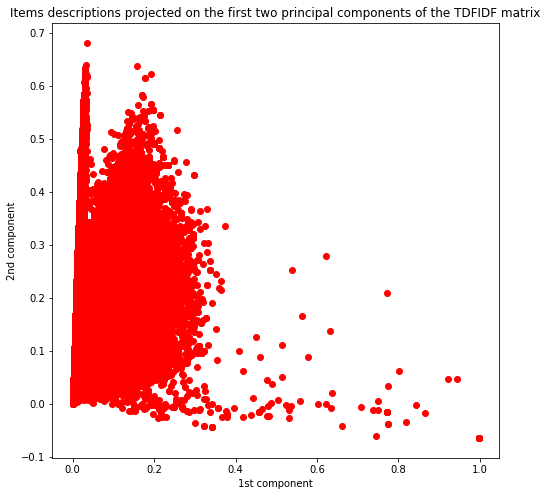

In [6]:
plt.figure(figsize=(8,8))
plt.title("Items descriptions projected on the first two principal components of the TDFIDF matrix")
plt.xlabel("1st component")
plt.ylabel("2nd component")
plt.plot(item_description_tokens_tfidf_svd.transpose()[0], item_description_tokens_tfidf_svd.transpose()[1],'ro')
plt.show()

In [6]:
# Create a new figure
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600,
                       title="tf-idf and SVD on the item description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [7]:
# Putting some order in the input going to be plotted
tfidf_svd_df = pd.DataFrame(item_description_tokens_tfidf_svd, columns=['x', 'y'])
tfidf_svd_df['reindex']=range(1,data_mercari.shape[0]+1)
tfidf_svd_df.set_index('reindex',inplace=True)

tfidf_svd_df['description'] = data_mercari['item_description']
tfidf_svd_df['tokens'] = data_mercari['item_description_token']

# We only take a sample of the dataset, otherwise the JS outputs becomes toooo slow on my laptop ... 
N = 10000
tfidf_svd_df_sample = tfidf_svd_df.sample(N)

In [8]:
plot_tfidf.scatter(x='x', y='y', source=tfidf_svd_df_sample, alpha=0.7)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips = {"description": "@description", "tokens": "@tokens"}
show(plot_tfidf)

If you have troubles viewing the JS plotter, here is a snapshot of what it looks like :
<img src="Img/Snapshot_SVD_dynamic.png" alt="Drawing" style="width: 600px;"/>

The interactive analysis helps us a lot for understanding the results of the SVD. Indeed, some item descriptions are highly correlated to the axes (i.e. the principal components) as they appear very often in the dataset.
* The first axis (x-axis) represents the default item description **"No description yet"** that a lot of vendors do not modify when selling goods on Mercari.
* The second axis (y-axis) represents more diverse cases with item descriptions very similar to **"Brand new, never worn"** (with alternative versions).

<img src="Img/SVD_principal_axis.png" alt="Drawing" style="width: 500px;"/>

Consequently we see that by reducing dimensions to two with SVD on the TFIDF matrix, was not such a good idea as expected: this method leads to summing up all the item descriptions to a linear combination of "No description yet" and "Brand new, never worn", the two dominant descriptions. We need non-linear methods for reducing dimensionality and still keeping the diversity of item descriptions.

One common strategy is to 
* downsize the TFIDF matrix to, let's say 20 dimensions,
* then perform a non-linear (thus time-consuming) dimensionality reduction algorithm.

### t-distributed Stochastic Neighbor Embedding

**t-SNE** is a nonlinear dimensionality reduction technique that is particularly well-suited for embedding high-dimensional data into a space of two or three dimensions, which can then be visualized in a scatter plot. The t-SNE algorithm aims at finding an optimal configuration respecting proximity between points : 2 close (resp. distant) points in the initial space have to be close (resp. distant) in the low-dimension space.

[Wikipedia page](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)

In [9]:
SVD = TruncatedSVD(n_components=20)
item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)

In [53]:
# Sampling the data in order to accelerate the t-SNE algorithm
index_sample = np.array([i for i in range(1,data_mercari.shape[0]+1)])
index_sample = np.sort(np.random.choice(index_sample, size=20000))

In [77]:
item_description_tokens_tfidf_svd_sample = item_description_tokens_tfidf_svd[index_sample][:]

In [78]:
TSNE = sklearn.manifold.TSNE(n_components=2, verbose=1, n_iter=250)
item_description_tokens_tfidf_tsne = TSNE.fit_transform(item_description_tokens_tfidf_svd_sample)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.026s...
[t-SNE] Computed neighbors for 20000 samples in 11.732s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabilities for sample 3000 / 20000
[t-SNE] Computed conditional probabilities for sample 4000 / 20000
[t-SNE] Computed conditional probabilities for sample 5000 / 20000
[t-SNE] Computed conditional probabilities for sample 6000 / 20000
[t-SNE] Computed conditional probabilities for sample 7000 / 20000
[t-SNE] Computed conditional probabilities for sample 8000 / 20000
[t-SNE] Computed conditional probabilities for sample 9000 / 20000
[t-SNE] Computed conditional probabilities for sample 10000 / 20000
[t-SNE] Computed conditional probabilities for sample 11000 / 20000
[t-SNE] Computed conditional probabilities for sample 12000 / 20000
[t-SNE] Computed conditional probabilities for sa

Once again, we plot the projection of the item descriptions on the plane obtained after t-SNE dimensionality reduction.

* the first graph is a simple matplotlib.pyplot graph.
* the second graph is the interactive datavizualisation.

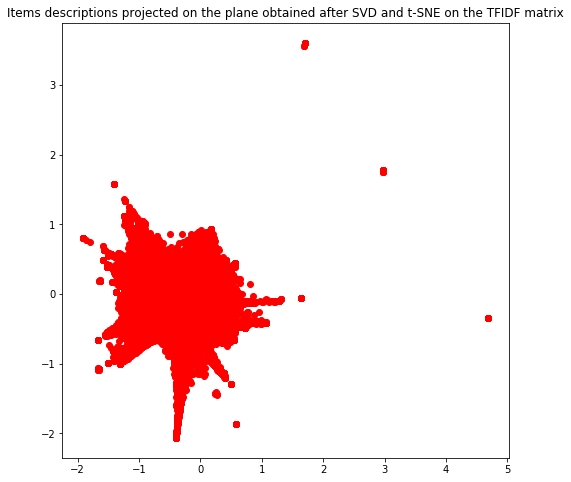

In [191]:
plt.figure(figsize=(8,8))
plt.title("Items descriptions projected on the plane obtained after SVD and t-SNE on the TFIDF matrix")
plt.plot(item_description_tokens_tfidf_tsne.transpose()[0], item_description_tokens_tfidf_tsne.transpose()[1],'ro')
plt.show()

**Now, plotting the dynamic vizualisation**

In [195]:
# Create a new figure
output_notebook()
plot_tfidf_tsne = bp.figure(plot_width=700, plot_height=600,
                       title="TF-IDF, SVD & t-SNE on the item descriptions",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [196]:
# Putting some order in the input going to be plotted
tfidf_tsne_df = pd.DataFrame(item_description_tokens_tfidf_tsne, columns=['x', 'y'])
tfidf_tsne_df['reindex'] = index_sample+1
tfidf_tsne_df.set_index('reindex',inplace=True)

tfidf_tsne_df['description'] = data_mercari['item_description'].iloc[index_sample]
tfidf_tsne_df['tokens'] = data_mercari['item_description_token'].iloc[index_sample]

In [197]:
plot_tfidf_tsne.scatter(x='x', y='y', source=tfidf_tsne_df, alpha=0.7)
hover = plot_tfidf_tsne.select(dict(type=HoverTool))
hover.tooltips = {"description": "@description", "tokens": "@tokens"}
show(plot_tfidf_tsne)

If you cannot run the last few cells, here is a snapshot of what it looks like :
<img src="Img/Snapshot_tSNE_dynamic.png" alt="Drawing" style="width: 500px;"/>

**Disclaimer :** *Please kindly note that the aspect of the t-SNE obtained while working on this project may slightly differ from the one you will obtain on your own computer (at least for the random sampling we performed!).*

At the end of the day, we obtained a non-trivial visualisation of the item descriptions projected onto a 2d space. The overwhelming descriptions "brand new, never worn" and "no description yet" have now much less impact on the dimensionnality reduction. You can visualize these items descriptions as the 3 isolated and distant points on the graph.

### Clustering the `item_descriptions`

To perform the clustering on the `item_description` we use a variant of the k-means clustering algorithm, the **mini batch k-means**. Mini batch k-means uses mini-batches to reduce the computation time of regular k-means, while still attempting to optimise the same objective function. Mini-batches are subsets of the input data, randomly sampled in each training iteration. These mini-batches drastically reduce the amount of computation required to converge to a local solution. In contrast to other algorithms that reduce the convergence time of k-means, mini-batch k-means produces results that are generally only slightly worse than the standard algorithm.

The algorithm iterates between two major steps. In the first step, $b$ samples are drawn randomly from the dataset, to form a mini-batch. These are then assigned to the nearest centroid. In the second step, the centroids are updated. In contrast to k-means, this is done on a per-sample basis. For each sample in the mini-batch, the assigned centroid is updated by taking the streaming average of the sample and all previous samples assigned to that centroid. This has the effect of decreasing the rate of change for a centroid over time. These steps are performed until convergence or a predetermined number of iterations is reached.

MiniBatchKMeans converges faster than k-means, but the quality of the results is reduced. In practice this difference in quality can be quite small as shown in the example available on [scikit-learn documentation](http://scikit-learn.org/stable/modules/clustering.html#mini-batch-kmeans).

<img src="http://scikit-learn.org/stable/_images/sphx_glr_plot_mini_batch_kmeans_001.png" style="width: 600px;"/>

In [156]:
#from sklearn.cluster import MiniBatchKMeans
num_clusters = 20 # number of clusters
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, max_iter=1000)

In [157]:
# fit : Compute the centroids
kmeans = kmeans_model.fit(item_description_tokens_tfidf_svd)

# fit_predict : Compute cluster centers and predict cluster index for each sample.
# --> For each observation (ie line of the TFIDF matrix) we get the cluster number (846461 x 1 array)
kmeans_clusters = kmeans.predict(item_description_tokens_tfidf_svd)

Once again, we plot the projection of the **clustered** item descriptions on the plane we previously obtained after t-SNE dimensionality reduction.

* the first graph is a simple matplotlib.pyplot graph.
* the second graph is the interactive datavizualisation.

In [159]:
kmeans_clusters_sample = kmeans_clusters[index_sample]
toPlot=np.vstack((item_description_tokens_tfidf_tsne.transpose(),kmeans_clusters_sample))

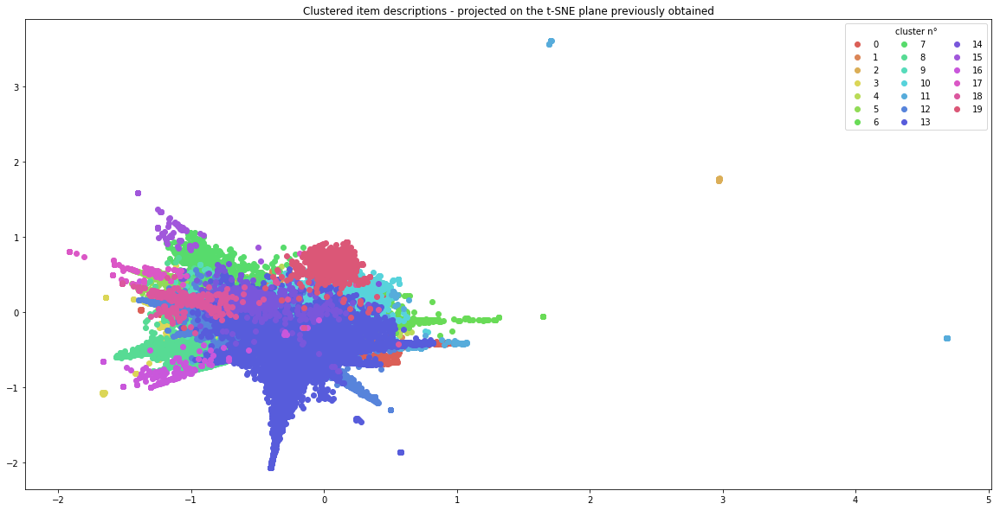

In [161]:
plt.figure(figsize=(20,10))
sns.set_palette(sns.color_palette("hls", 20))
plt.title("Clustered item descriptions - projected on the t-SNE plane previously obtained")
for k in range(num_clusters):
    plt.plot(toPlot[0][toPlot[2]==k], toPlot[1][toPlot[2]==k],'o',label=str(k))
plt.legend(title="cluster n°", ncol=3)
plt.show()

**Dynamic visualisation**

In [189]:
colormap = np.array(sns.color_palette("hls", 20).as_hex())

In [173]:
#combined_sample.reset_index(drop=True, inplace=True)
kmeans_df = tfidf_tsne_df
kmeans_df['cluster'] = kmeans_clusters_sample
#kmeans_df['cluster']=kmeans_df.cluster.astype(str).astype('category')

In [193]:
output_notebook()
plot_kmeans = bp.figure(plot_width=700, plot_height=600,
                        title="KMeans clustering of the description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [194]:
source = ColumnDataSource(data=dict(x=kmeans_df['x'], y=kmeans_df['y'],
                                    color=colormap[kmeans_clusters_sample],
                                    description=kmeans_df['description'],
                                    cluster=kmeans_df['cluster']))

plot_kmeans.scatter(x='x', y='y', color='color', source=source)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"description": "@description", "cluster":"@cluster" }
show(plot_kmeans)

If you cannot run the last few cells, here is a snapshot of what it looks like:
<img src="Img/Snapshot_clustering_dynamic.png" alt="Drawing" style="width: 500px;"/>

### Correlations between `price` and `item_description`

Let's plot the price distribution within each cluster and see if there exists any relation between price and the clusters on item_description

In [163]:
#influence of cluster vs. price
data_mercari['description_cluster']=kmeans_clusters

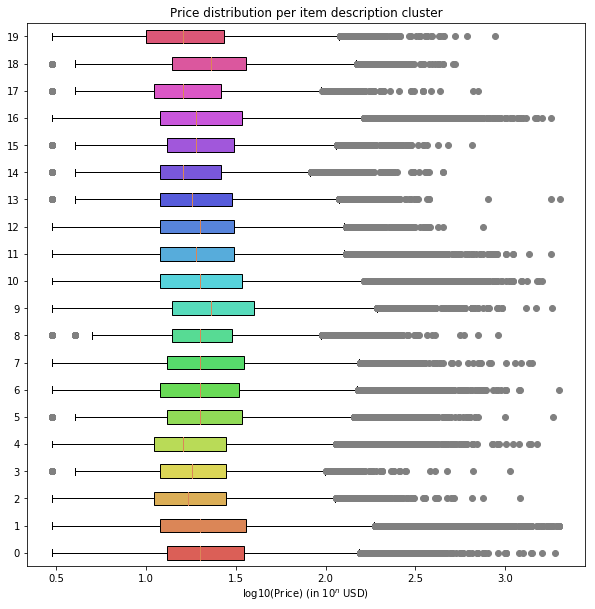

In [165]:
# BoxPlot per cluster
plt.figure(figsize=(10,10))

plt.title('Price distribution per item description cluster')
toPlot = [np.array(np.log10(data_mercari.sort_values(by='description_cluster', ascending=True).price[data_mercari.description_cluster==k]))\
          for k in data_mercari.description_cluster.unique()]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,max(data_mercari.description_cluster)+2),range(num_clusters))

colors = sns.color_palette("hls", 20)
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

Unfortunately, we observe that clusters as such do not give so much information in order to predict price since the `log10(Price)` distribution is roughly the same in every cluster...

However, we previously observed when analysisng the influence of the `item_condition_id` vs `price` that it is hard to reject the influence of the item_description cluster right away. Indeed, when considering some particular categories, we see that the `log10(price)` distribution varies with the cluster to which the item belongs.

For instance, when considering only the **electronics** main category :

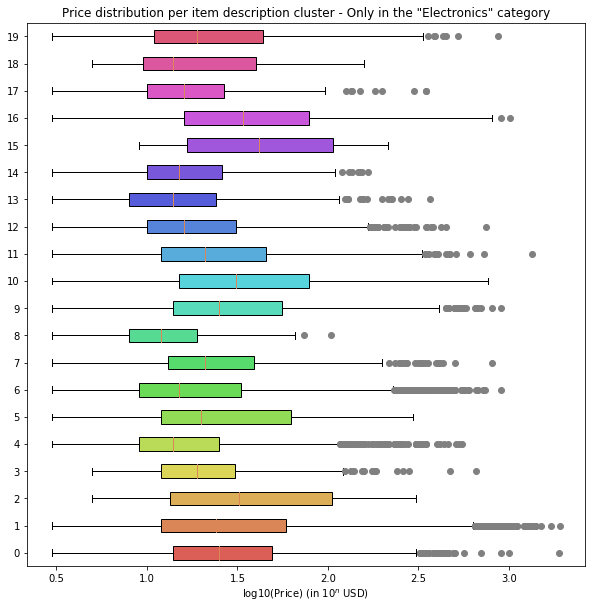

In [204]:
# BoxPlot per cluster - only in the electronics category
plt.figure(figsize=(10,10))

plt.title('Price distribution per item description cluster - Only in the "Electronics" category')
toPlot = [np.array(np.log10(data_mercari.sort_values(by='description_cluster', ascending=True).price[data_mercari.description_cluster==k][data_mercari.main_cat=="Electronics"]))\
          for k in data_mercari.description_cluster.unique()]
bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
plt.xlabel('log10(Price) (in $10^n$ USD)')
plt.yticks(range(1,max(data_mercari.description_cluster)+2),range(num_clusters))

colors = sns.color_palette("hls", 20)
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

### Correlations between `price` and `item_description` @`category` level

This gives us the idea to perform a specific clustering for the each category and see if it could help predicting price!

In [67]:
def clusteringPerMainCat(category):
    
    
    item_description_tokens = data_mercari.item_description_token[data_mercari.main_cat==category]
    
    print("*************** ",category," ***************")
    
    ### TFIDF
    TFIDF = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=lambda x: x,
      tokenizer=lambda key: item_description_tokens[key])
    #print('We are computing the TFIDF of the data set ...')
    item_description_tokens_tfidf = TFIDF.fit_transform(item_description_tokens.keys())
    #print('TFIDF computed!')
    
    
    ### SVD WITH 20 COMPONENTS 
    #print('We are computing the SVD of the TFIDF matrix ...')
    SVD = TruncatedSVD(n_components=20)
    item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)
    #print('SVD computed!')
    
    
    ### k-means clustering with 20 clusters
    num_clusters = 20 
    kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, max_iter=1000)
    #print('We are clustering over the SVD ...')
    kmeans = kmeans_model.fit(item_description_tokens_tfidf_svd)
    kmeans_clusters = kmeans.predict(item_description_tokens_tfidf_svd)
    #print('Clustering computed!')
    
    
    #influence of cluster vs. price
    toPlot_df = pd.DataFrame(data_mercari.price[data_mercari.main_cat==category])
    toPlot_df['description_cluster']=kmeans_clusters
    
    
    # BoxPlot per cluster - only in the selected category
    #print('We are processing the graph ...')
    
    plt.figure(figsize=(8,8))
    plt.title('Price distribution per item description cluster - clustering performed over the '+category+' category')
    toPlot = [np.array(np.log10(toPlot_df.sort_values(by='description_cluster', ascending=True).price[toPlot_df.description_cluster==k]))\
          for k in toPlot_df.description_cluster.unique()]
    bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
    plt.xlabel('log10(Price) (in $10^n$ USD)')
    plt.yticks(range(1,max(toPlot_df.description_cluster)+2),range(num_clusters))
    colors = sns.color_palette("hls", 20)
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
    plt.show()

***************  Electronics  ***************


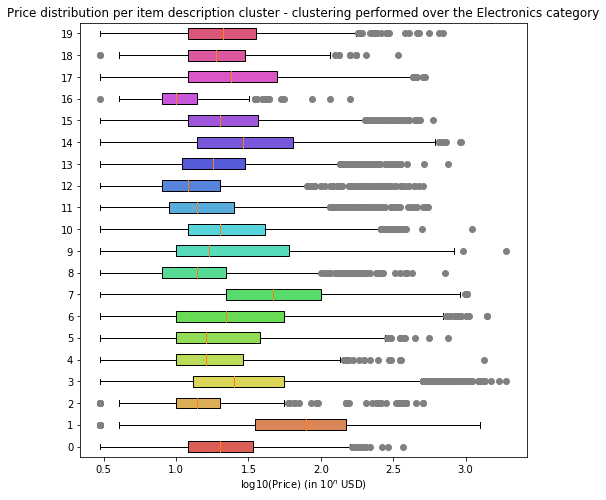

***************  Women  ***************


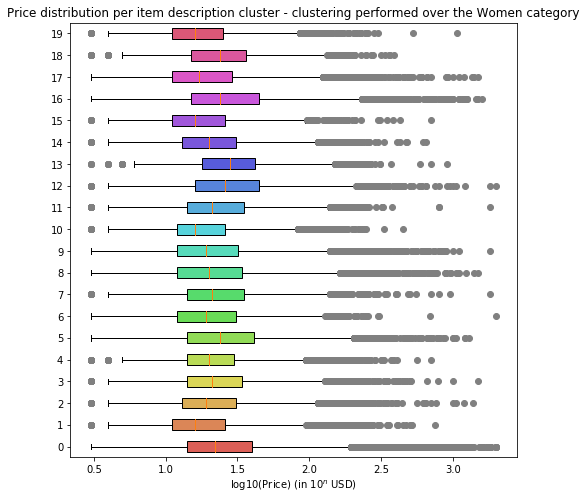

***************  Sports & Outdoors  ***************


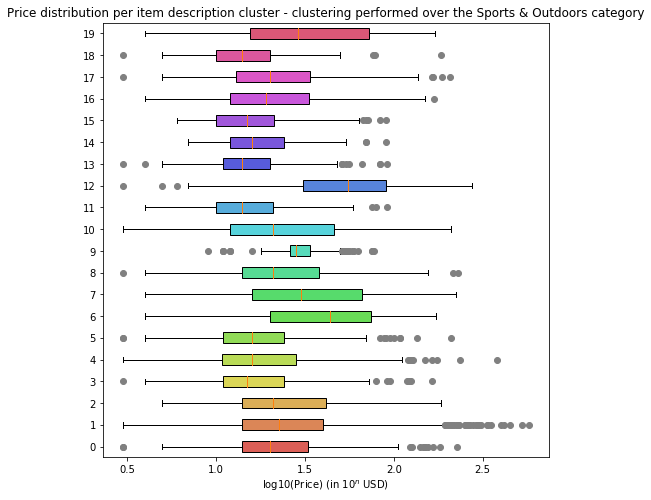

***************  Beauty  ***************


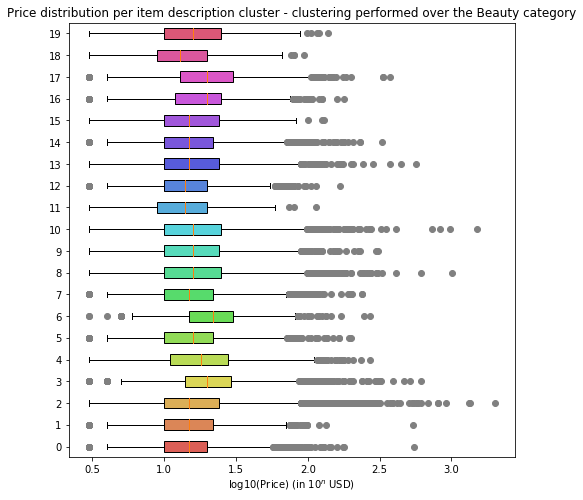

***************  Other  ***************


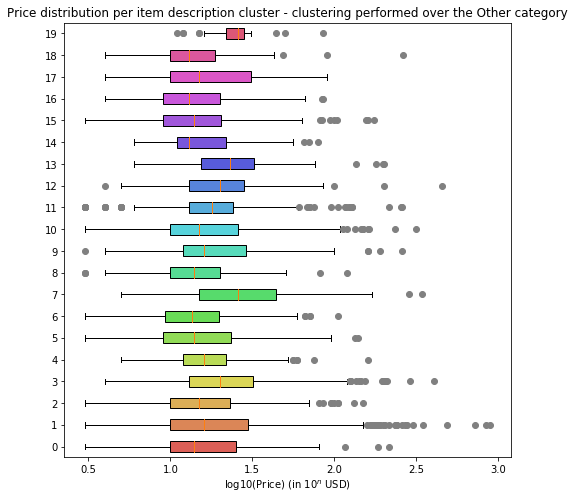

***************  Men  ***************


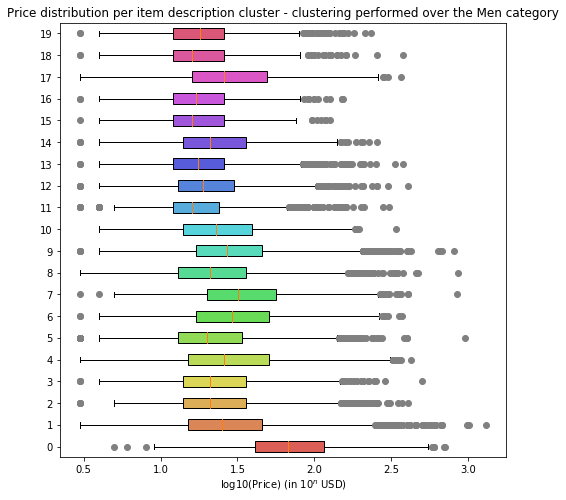

***************  Home  ***************


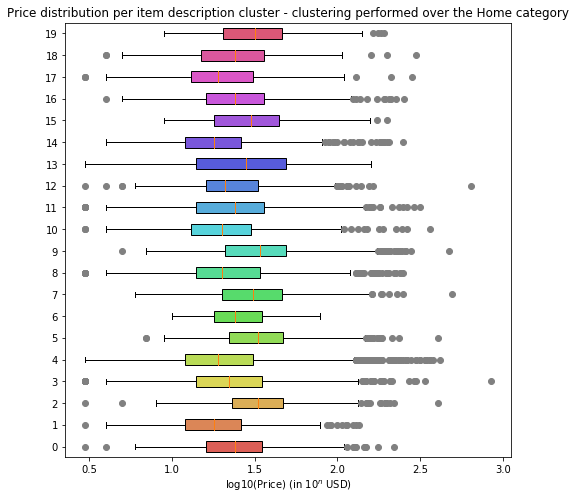

***************  Kids  ***************


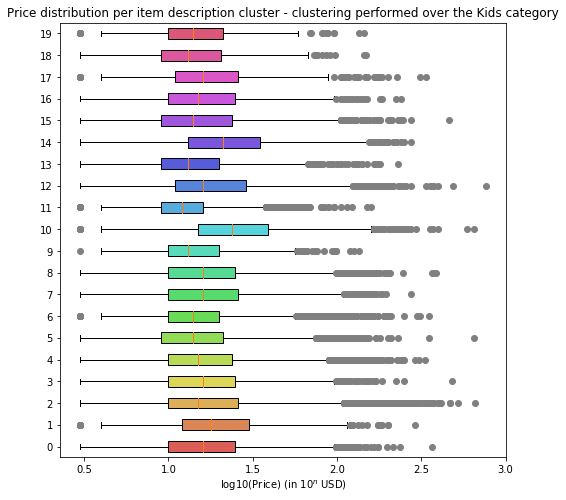

***************  Vintage & Collectibles  ***************


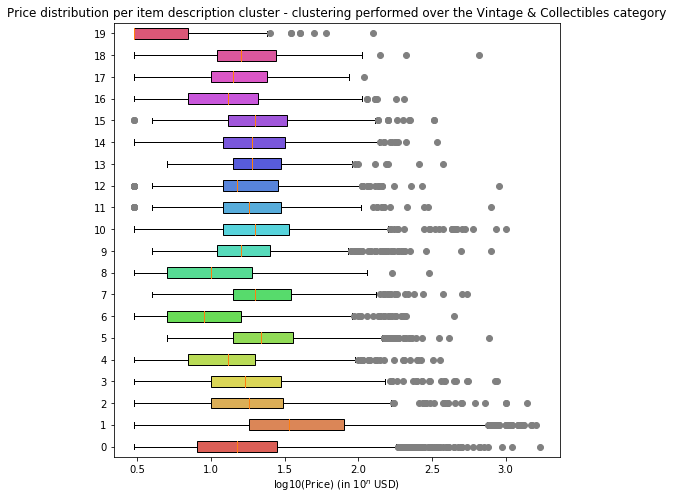

***************  Handmade  ***************


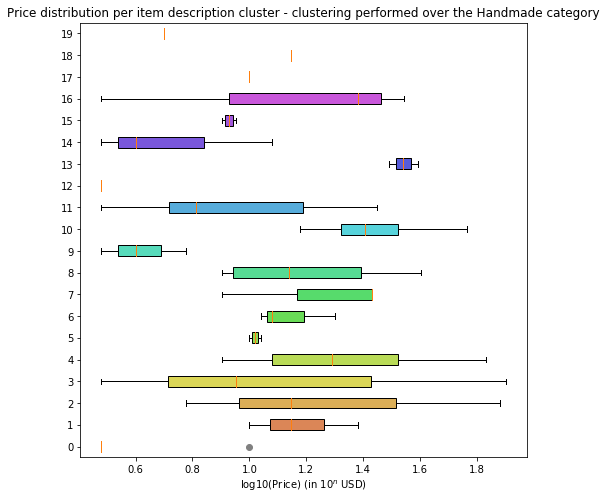

In [68]:
for category in data_mercari.main_cat.unique():
    clusteringPerMainCat(category)

At the end of the day, we observe that performing a specific clustering for each `main_cat` gives us a little bit more insights on the correlations between `price` and `clusters` in most cases. However, it appears that boxplots are still quite large in each cluster which means high `price`variance within each cluster: clustering descriptions in each category may help us for predicting a price trend but will not be enough for achieving accuracy.

### Correlations between `price` and `item_description` @`sub_category` level

Now, let's see if performing a specific clustering for the some `sub_categories` could help predicting `price`!

In [80]:
def clusteringPerSubCat(category, subcategory):
    
    
    item_description_tokens = data_mercari.item_description_token[data_mercari.main_cat==category][data_mercari.subcat_1==subcategory]
    
    print("*************** (",category," ",subcategory,") ***************")
    
    ### TFIDF
    TFIDF = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=lambda x: x,
      tokenizer=lambda key: item_description_tokens[key])
    #print('We are computing the TFIDF of the data set ...')
    item_description_tokens_tfidf = TFIDF.fit_transform(item_description_tokens.keys())
    #print('TFIDF computed!')
    
    
    ### SVD WITH 20 COMPONENTS 
    #print('We are computing the SVD of the TFIDF matrix ...')
    SVD = TruncatedSVD(n_components=20)
    item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)
    #print('SVD computed!')
    
    
    ### k-means clustering with 20 clusters
    num_clusters = 20 
    kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, max_iter=1000)
    #print('We are clustering over the SVD ...')
    kmeans = kmeans_model.fit(item_description_tokens_tfidf_svd)
    kmeans_clusters = kmeans.predict(item_description_tokens_tfidf_svd)
    #print('Clustering computed!')
    
    
    #influence of cluster vs. price
    toPlot_df = pd.DataFrame(data_mercari.price[data_mercari.main_cat==category][data_mercari.subcat_1==subcategory])
    toPlot_df['description_cluster']=kmeans_clusters
    
    
    # BoxPlot per cluster - only in the selected category
    #print('We are processing the graph ...')
    
    plt.figure(figsize=(8,8))
    plt.title('Price distribution per item description cluster - clustering performed over the ('+category+', '+subcategory+' subcategory1')
    toPlot = [np.array(np.log10(toPlot_df.sort_values(by='description_cluster', ascending=True).price[toPlot_df.description_cluster==k]))\
          for k in toPlot_df.description_cluster.unique()]
    bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
    plt.xlabel('log10(Price) (in $10^n$ USD)')
    plt.yticks(range(1,max(toPlot_df.description_cluster)+2),range(num_clusters))
    colors = sns.color_palette("hls", 20)
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
    plt.show()

*************** ( Women   Athletic Apparel ) ***************


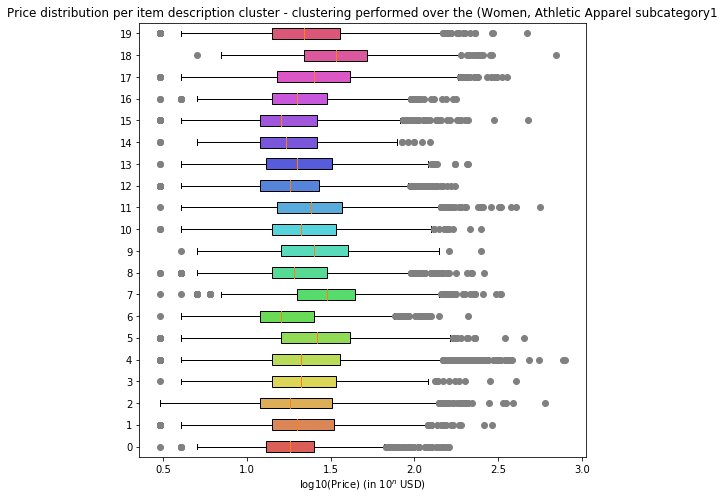

*************** ( Beauty   Makeup ) ***************


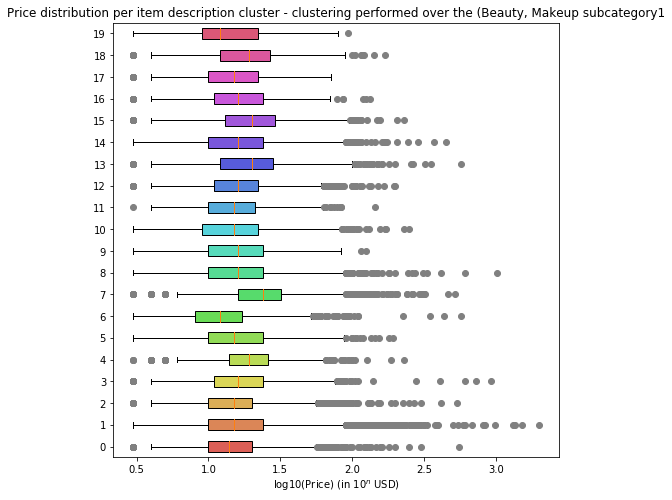

*************** ( Women   Tops & Blouses ) ***************


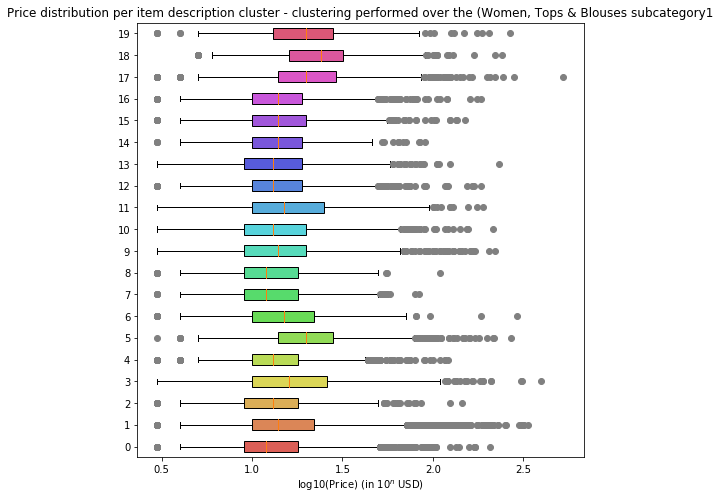

*************** ( Women   Shoes ) ***************


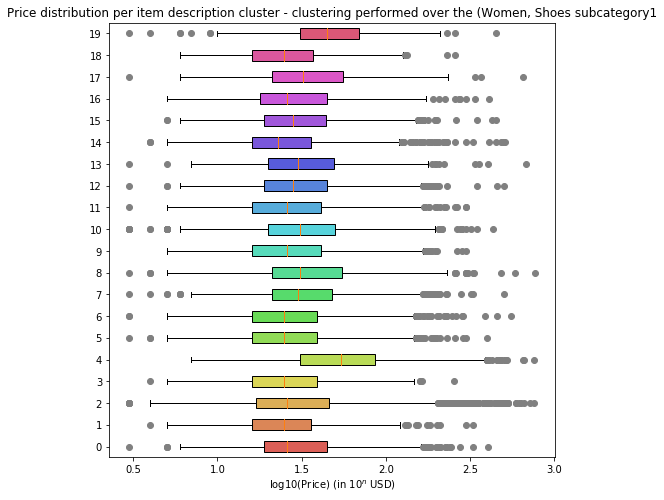

*************** ( Women   Women's Handbags ) ***************


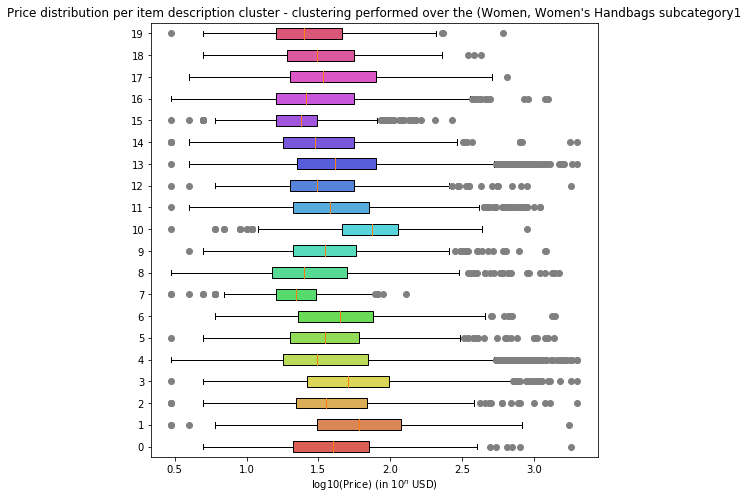

*************** ( Kids   Toys ) ***************


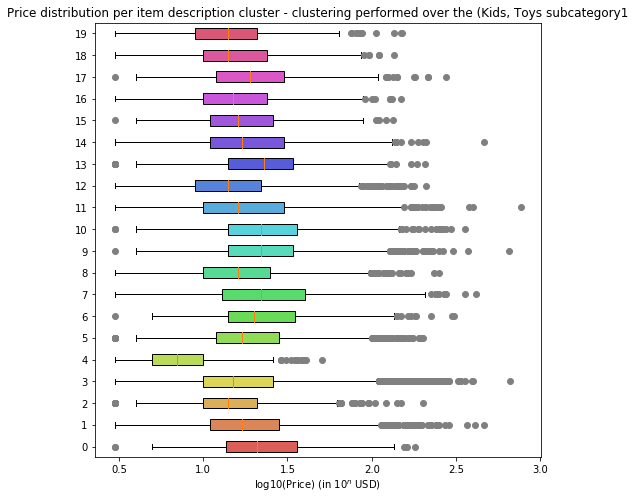

*************** ( Women   Dresses ) ***************


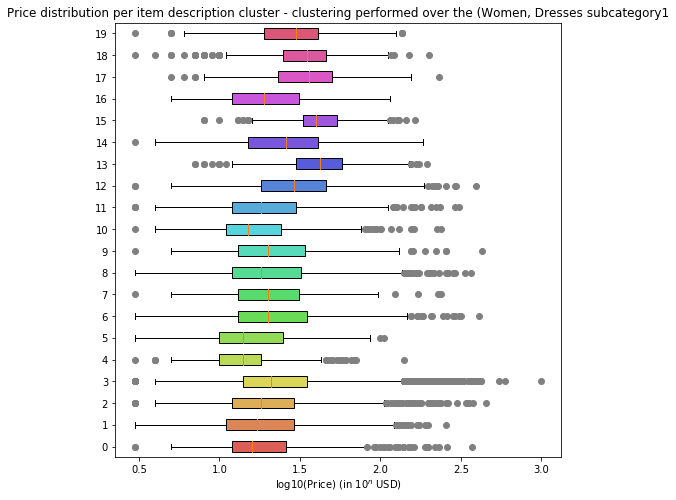

*************** ( Women   Sweaters ) ***************


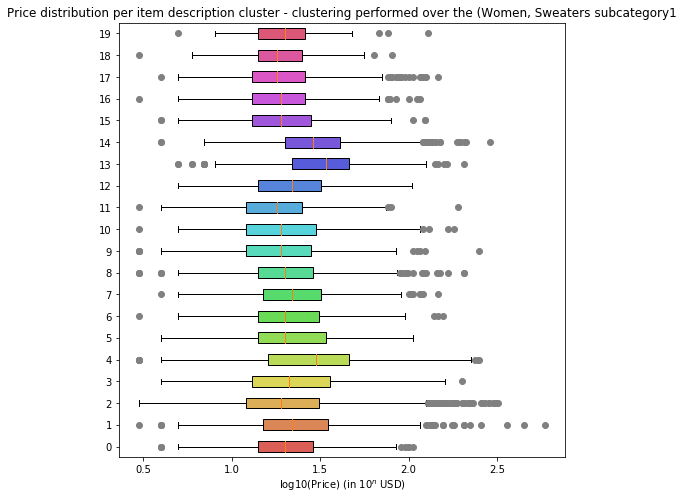

*************** ( Women   Women's Accessories ) ***************


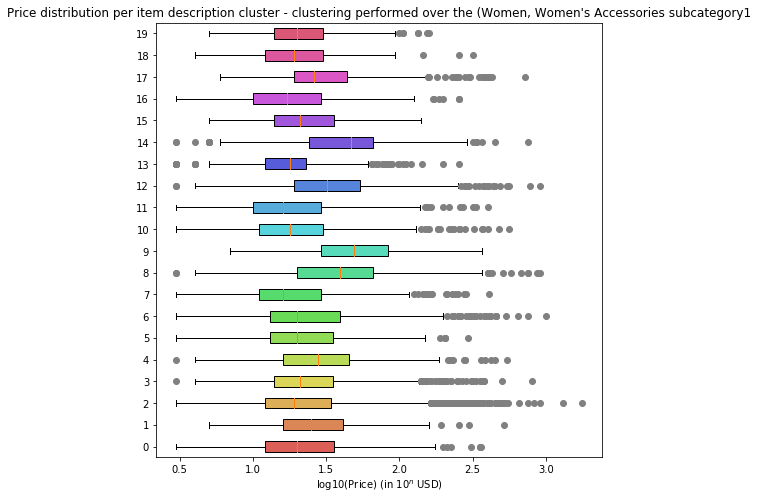

*************** ( Electronics   Video Games & Consoles ) ***************


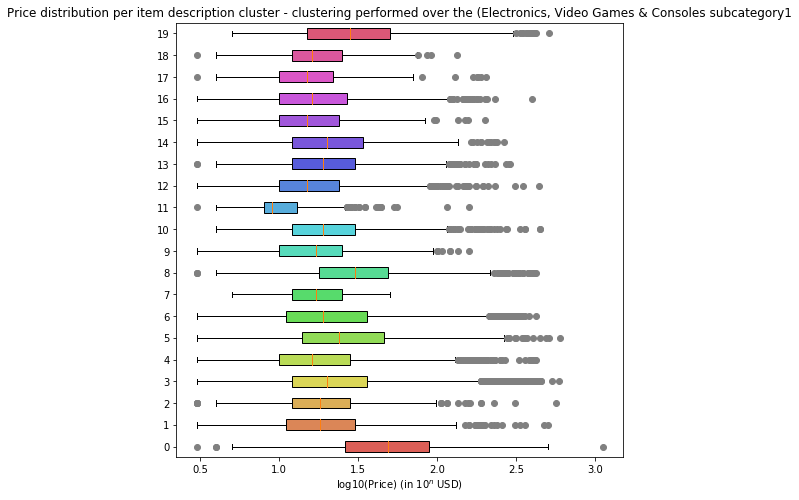

In [81]:
nb_items_subcat1 = data_mercari.groupby(('main_cat','subcat_1')).agg('count')
toPlot_subcat1 = nb_items_subcat1.sort_values('name', ascending=0).head(10).index

for sub in toPlot_subcat1:
    clusteringPerSubCat(sub[0],sub[1])

### Correlations between `price` and `item_description` @`brand_name` level

Now, let's see if performing a specific clustering for the some `brand_names` could help predicting `price`!

In [82]:
def clusteringPerBrand(brand):
    
    
    item_description_tokens = data_mercari.item_description_token[data_mercari.brand_name==brand]
    
    print("*************** ",brand," ***************")
    
    ### TFIDF
    TFIDF = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=lambda x: x,
      tokenizer=lambda key: item_description_tokens[key])
    #print('We are computing the TFIDF of the data set ...')
    item_description_tokens_tfidf = TFIDF.fit_transform(item_description_tokens.keys())
    #print('TFIDF computed!')
    
    
    ### SVD WITH 20 COMPONENTS 
    #print('We are computing the SVD of the TFIDF matrix ...')
    SVD = TruncatedSVD(n_components=20)
    item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)
    #print('SVD computed!')
    
    
    ### k-means clustering with 20 clusters
    num_clusters = 20 
    kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, max_iter=1000)
    #print('We are clustering over the SVD ...')
    kmeans = kmeans_model.fit(item_description_tokens_tfidf_svd)
    kmeans_clusters = kmeans.predict(item_description_tokens_tfidf_svd)
    #print('Clustering computed!')
    
    
    #influence of cluster vs. price
    toPlot_df = pd.DataFrame(data_mercari.price[data_mercari.brand_name==brand])
    toPlot_df['description_cluster']=kmeans_clusters
    
    
    # BoxPlot per cluster - only in the selected category
    #print('We are processing the graph ...')
    
    plt.figure(figsize=(8,8))
    plt.title('Price distribution per item description cluster - clustering performed over the '+brand+' brand')
    toPlot = [np.array(np.log10(toPlot_df.sort_values(by='description_cluster', ascending=True).price[toPlot_df.description_cluster==k]))\
          for k in toPlot_df.description_cluster.unique()]
    bplot = plt.boxplot(toPlot, 0, 'grey', 0, patch_artist=True)
    plt.xlabel('log10(Price) (in $10^n$ USD)')
    plt.yticks(range(1,max(toPlot_df.description_cluster)+2),range(num_clusters))
    colors = sns.color_palette("hls", 20)
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
    plt.show()

***************  Nike  ***************


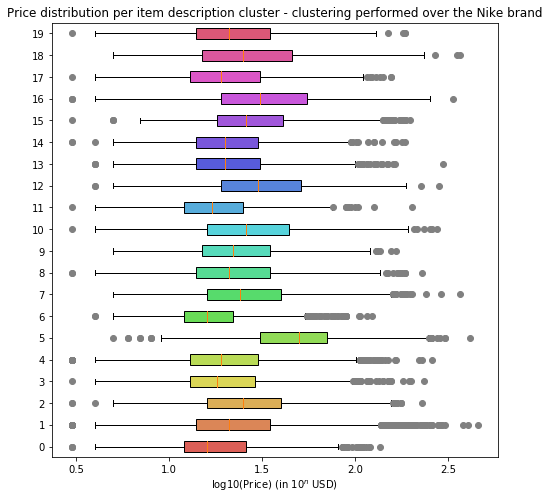

***************  PINK  ***************


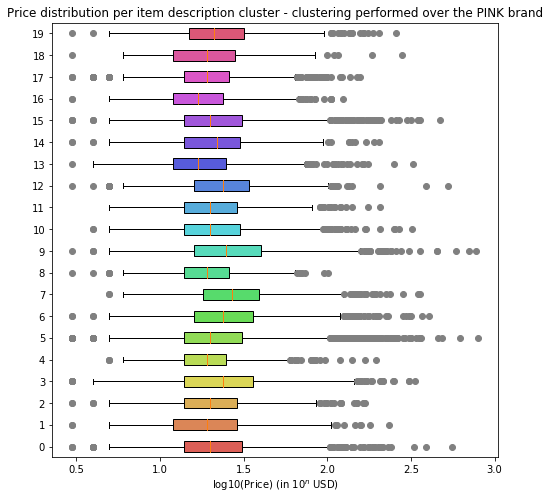

***************  Victoria's Secret  ***************


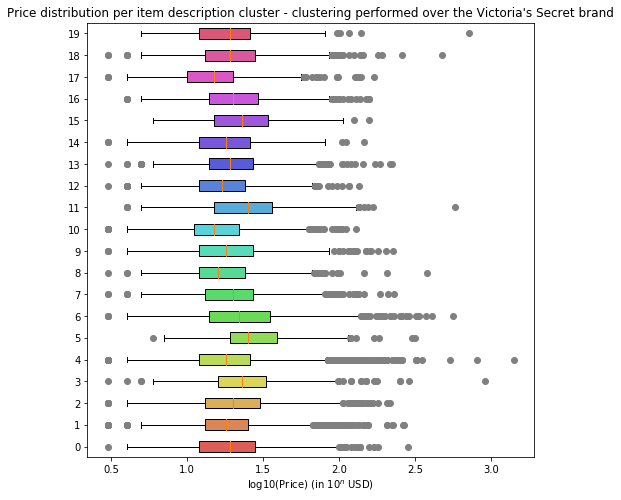

***************  LuLaRoe  ***************


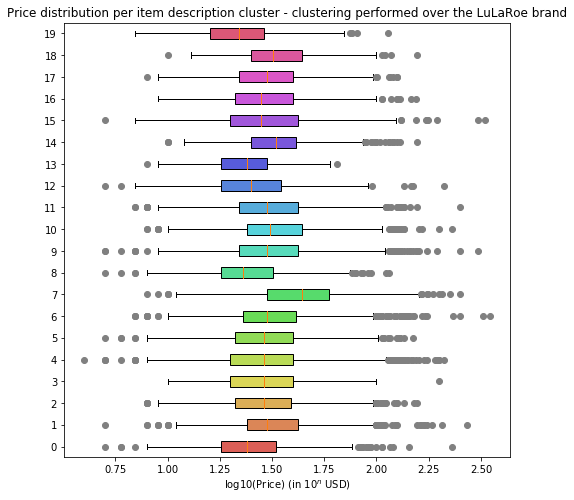

***************  Apple  ***************


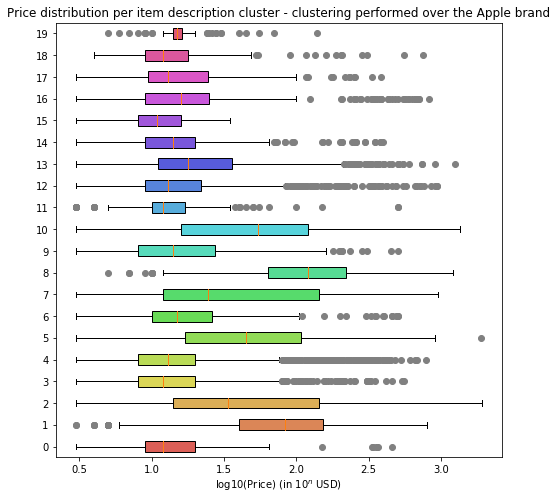

***************  FOREVER 21  ***************


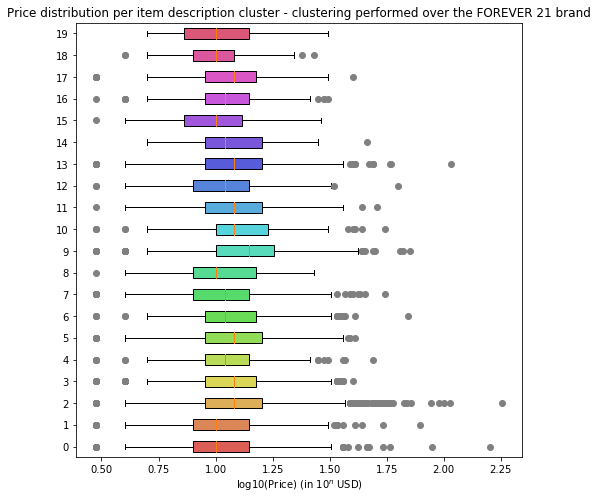

***************  Nintendo  ***************


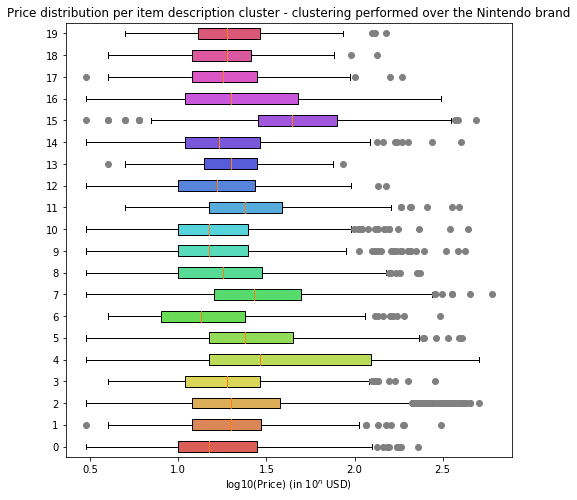

***************  Lululemon  ***************


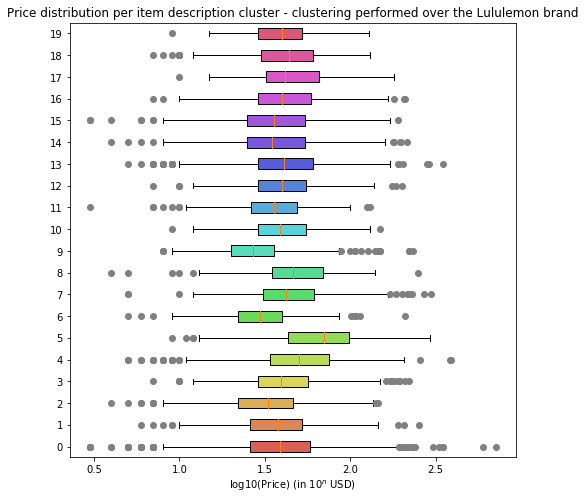

***************  Michael Kors  ***************


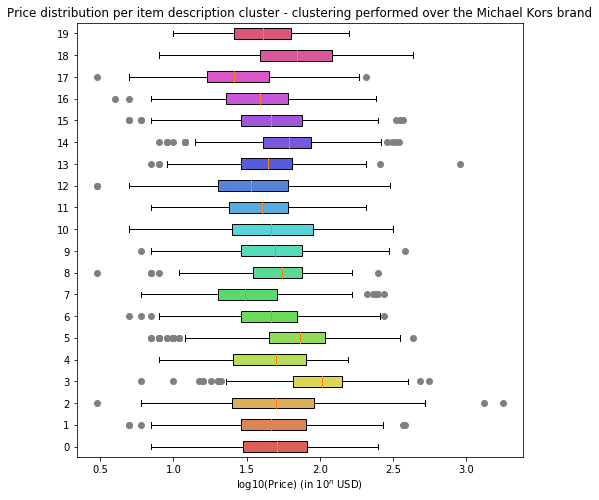

***************  American Eagle  ***************


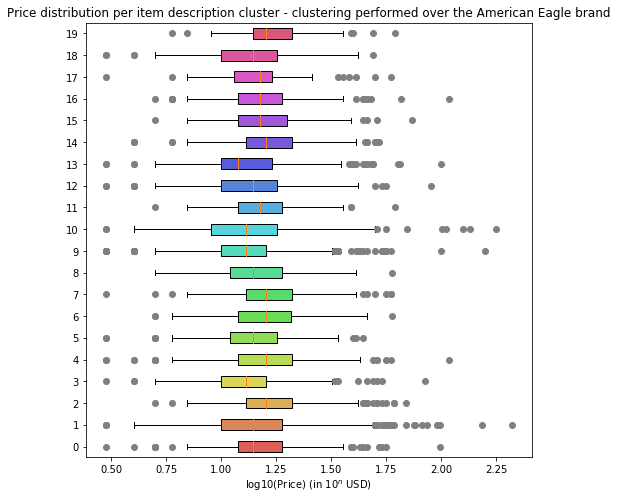

In [86]:
nb_items_brand = data_mercari.groupby('brand_name').agg('count').sort_values('name', ascending=0).head(10).index
for brand in nb_items_brand:
    clusteringPerBrand(brand)

Eventually we come up with the same conclusion as previously: there is some correlations between `item_descriptions_clusters` and `price` especially when considering electronics goods (see the example of Apple with very condensated boxplots).

# Status report of the explanoratory analysis

To put it in a nutshell,
* We visualized and analyzed the influence of each explanatory variable on the `price` of an item.
* We dealt with unstructured textual data (`item_description`) by adopting the "bag-of-words" model and performing some natural language processing operations on it (TFIDF, SVD, t-SNE for visualisation, k-means clustering).
* We ensured consistency-checkings and data-cleaning on the go.

We draft the following conlusions:
* Most items are relatively cheap items (\$3-\$30) but there are a lot outliers too (expensive items `max(price)`$\simeq$\$2000. To account for such differences and better visualize the `price` distribution we considered the `log10(price)`instead.
* Low prices are linked to `shipping=1`(the buyer has to pay shipping fees) vs. high prices are linked to `shipping=0` (no shipping fees to pay) but this is not such a profound effect.
* `item_condition_id` has no overall influence, but it has a strong impact on `price` of a **given item** (we took the example of the iPhone). For a given item, high prices are linked to `item_condition_id=1` (excellent conditions) and low prices are linked to `item_condition_id=5` (poor condition).
* `categories` do not have any overall influence, but are still very important for categorizing goods and building specific models if needed.
* `brand_name` have a strong impact on `price` distribution!
* The way we analysed `item_description` gives us the following insights:
 * On average, `log10(price)` slighlty increases with the length of `item_description`
 * Clustering on `item_description` as little overall impact, but it has so at `category`, `subcategory`and `brand_name` levels.
 
 
 These conclusions give us some guidelines regarding the prediction model we aim at designing.

# Estimation question

** <span style="color:red"> Write explanations here</span> ** 
* 
* 
* 

In order to measure the quality of our estimations vs. the real `price` value, we need to define a metric to use. The Kaggle challenge considers the Root Mean Squared Logarithmic Error defined as follow : $\epsilon := \sqrt{\frac{1}{n} \sum_{i=1}^{n}(\log(\hat{p}_i+1)-\log(p_i+1))^2 }$

Yet, we do not think that it is an adaptated metric, and we find it hard to define a proper one. Indeed $\log(\hat{p}_i+1)-\log(p_i+1)=\log\left(\frac{\hat{p}_i+1}{p_i+1}\right)$, and the RMSLE metric measures in fine the ratio between the prediction and the real value. This is not a good idea since:
* When considering cheap items, having $\frac{\hat{p}_i+1}{p_i+1}=2$ has a very little impact when $p_i=\$1$. A customer makes roughly no difference between an item sold at \$1 or at \$3, and the pricing $\hat{p}_i=\$3$ should be considered as correct.
* When considering expensive items, having $\frac{\hat{p}_i+1}{p_i+1}=2$ has a big impact when $p_i=\$1000$. A customer feels the difference between an item sold at \$1000 or at \$2000, and the pricing $\hat{p}_i=\$2000$ should be considered as uncorrect.

For this reason, we think that the $L_1$ or $L_2$ errors better suits the problematic, with a preference for the $L_2$ error since it penalizes more than $L_1$ when the prediction is far from the real value. Thus, we will use:

$\epsilon_{L_2} := \sqrt{\frac{1}{n} \sum_{i=1}^{n}(\hat{p}_i-p_i)^2 }$

### Preprocessing the data

We start from scratch with the dataset semi-cleaned (`NaN` removed, `category` and `subcategories` variables created, free items removed and `brand_name` cleaned), and we preprocess the data accordingly to what was previously done.

In [ ]:
#TFIDF.transform(raw_documents, copy=True)
#TruncatedSVD.transform(X)

We now divide our dataset into a training and a testing set, and we apply the adapted preprocessing methods with respect to what has previously been done.

In [13]:
# Opening the Pickle data
with open("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned.pickle", 'rb') as f:
    data_mercari = pickle.load(f)

In [6]:
#choosing 80% of data for training set and the rest for test
training_indices = np.random.rand(len(data_mercari)) < 0.8
train = data_mercari[training_indices]
test = data_mercari[~training_indices]

In [7]:
stopwords = nltk.corpus.stopwords.words('english')
stopwords.remove('no')
stopwords.remove('not')

In [14]:
def preprocessing(string):
    # lower_case
    string = string.lower()
    # remove [rm]
    string = string.replace(' [rm]','')
    # remove accents
    string = unidecode.unidecode(string)
    # remove stopwords
    pattern = re.compile(r'\b(' + r'|'.join(stopwords) + r')\b\s*')
    string = pattern.sub('', string)
    # remove special caracters like ""
    string = re.sub('[^A-Za-z0-9. ]','', string)
    # lematize
    string = nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string,"v")
    string = nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string,"a")
    string = nltk.stem.wordnet.WordNetLemmatizer().lemmatize(string)
    return(string)

In [18]:
TFIDF_train = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=preprocessing)

print('We are computing the TFIDF of the data set, please wait a few seconds ...')
# Compute the TFIDF matrix (+create a dictionnary ...)
item_description_tfidf_train = TFIDF_train.fit_transform(train.item_description)
print('TFIDF computed, thanks for having waited!')

We are computing the TFIDF of the data set, please wait a few seconds ...
TFIDF computed, thanks for having waited!


In [19]:
item_description_tfidf_train

<677763x147479 sparse matrix of type '<class 'numpy.float64'>'
	with 9428881 stored elements in Compressed Sparse Row format>

In [21]:
SVD_train = TruncatedSVD(n_components=20)
item_description_tfidf_svd_train = SVD_train.fit_transform(item_description_tfidf_train)

In [32]:
for i in range(0,20):
    name = 'TFIDF_feature_'+str(i+1)
    train[name] = np.array(item_description_tfidf_svd_train[:,i])

/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [34]:
train.head(3)

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description,TFIDF_feature_1,...,TFIDF_feature_11,TFIDF_feature_12,TFIDF_feature_13,TFIDF_feature_14,TFIDF_feature_15,TFIDF_feature_16,TFIDF_feature_17,TFIDF_feature_18,TFIDF_feature_19,TFIDF_feature_20
1,Razer BlackWidow Chroma Keyboard,3,Electronics,Computers & Tablets,Components & Parts,Razer,52.0,0,This keyboard is in great condition and works ...,0.003809,...,-0.058177,-0.018905,-0.014720,0.073910,0.024175,-0.049895,-0.031660,-0.019666,-0.007581,0.021695
2,AVA-VIV Blouse,1,Women,Tops & Blouses,Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,0.002652,...,0.133348,-0.029146,-0.033790,0.042279,-0.021650,-0.004137,-0.014702,-0.046847,0.007405,-0.002259
6,Acacia pacific tides santorini top,3,Women,Swimwear,Two-Piece,Acacia Swimwear,64.0,0,Size small but straps slightly shortened to fi...,0.006558,...,0.011762,-0.000776,-0.051565,0.001984,0.099189,0.134654,-0.028019,0.004314,0.052799,0.047139


In [35]:
# Save data in a pickle file
train.to_pickle("train_TFIDF_SVD.pickle")

In [36]:
item_description_tfidf_test = TFIDF_train.transform(test.item_description)

In [38]:
item_description_tfidf_svd_test = SVD_train.transform(item_description_tfidf_test)

In [40]:
item_description_tfidf_svd_test.shape

(168698, 20)

In [41]:
for i in range(0,20):
    name = 'TFIDF_feature_'+str(i+1)
    test[name] = np.array(item_description_tfidf_svd_test[:,i])

/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [42]:
test.head(3)

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description,TFIDF_feature_1,...,TFIDF_feature_11,TFIDF_feature_12,TFIDF_feature_13,TFIDF_feature_14,TFIDF_feature_15,TFIDF_feature_16,TFIDF_feature_17,TFIDF_feature_18,TFIDF_feature_19,TFIDF_feature_20
11,New vs pi k body mists,1,Beauty,Fragrance,Women,Victoria's Secret,34.0,0,(5) new vs pink body mists (2.5 oz each) Fresh...,0.002800,...,0.067788,0.013971,-0.024795,0.021369,-0.031796,-0.003464,-0.004059,-0.056016,-0.001273,0.082264
12,Black Skater dress,2,Women,Dresses,"Above Knee, Mini",rue,16.0,0,"Xl, great condition",0.009422,...,0.008382,0.078102,-0.011156,0.039841,0.018697,-0.059675,-0.016977,-0.014195,-0.068884,-0.027390
18,"Too Faced Limited ""Merry Macaroons""",1,Beauty,Makeup,Makeup Palettes,Too Faced,25.0,1,This AUTHENTIC pallete by Too Faced is brand n...,0.008357,...,-0.053156,-0.043025,-0.047108,0.067794,0.072071,0.025476,-0.072778,0.002481,0.062430,0.010215


In [44]:
# Save data in a pickle file
test.to_pickle("test_TFIDF_SVD.pickle")

# Mettre les trucs de Valentin

## Non-parametric model : k-nearest neighbors

During the exploratory analysis we discovered that 
 * `brand_name` has a strong impact on the price distribution.
 * `shipping`, `item_condition` and `item_description` have an impact on price only when considering a **specific given item**

The idea we want to explore is to build a model based on these observations. When a new data point $X^{test}$ comes in,
 * We first consider what kind of item it is, based on the categories it belongs to. We then filter the dataset accordingly.
 * Then, we consider its brand and again filter the dataset accordingly. The main challenge there is to avoid overfitting, to do so we will have to cluster "similar" brands (i.e. luxury brands, consumer products brands, etc.), and filter by brand cluster rather than by brand name.
 * Once the databse is filtered, we compute the k-nearest neighbors estimator: $\hat{f}(X^{test}) = \frac{1}{k}\sum_{X^{train}_i \in \mathcal{N}_k(X^{test})}Y_i^{train}$
 where the $X^{train}_i$ are the `shipping`, `item_condition` and `item_description` (after TDIF & SVD) variables
 <img src="Img/k-nn.png" alt="Drawing" style="width: 300px;"/>

### 1. Preprocessing: clustering on brands

As previously mentionned, we want to perform some clustering on `brand_names` in order to classify similar brands. Two brands are considered similar if the prices distributions within the two brands are close. We obtain a proxy of this distribution by considering (min, 1st quartile, mean, 3rd quartile, max) of the prices in a given brand. We then perform a mini-batch k-means clustering for clustering brands. 

Instead of directly considering `price` (which would give to much weight to price outliers - i.e. very expensive or very cheap products) we consider the `log10(price)` as in the exploratory analysis. 

In [2]:
# Opening the Pickle data
with open("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned.pickle", 'rb') as f:
    data_mercari = pickle.load(f)

In [41]:
# creating a pandas DataFrame with brands and their price distribution proxy
# Getting the percentiles is an heavy-cost computation and therefore we 
brands_df = pd.DataFrame(data_mercari.brand_name.unique(),columns=['brand_name'])
brands_df['mean_price'] = np.array(np.log10(data_mercari.groupby('brand_name').agg('mean').price))

brands_df['first_quartile_price']=1
brands_df['third_quartile_price']=1
brands_df['max_price']=1
brands_df['min_price']=1
i=0
print("Please wait, we are processing the data. It's going to take a few minutes ...")
for b in brands_df.brand_name:
    i+=1
    if (i%500==0):
        print(str(i)," brands processed yet")
    price = data_mercari.price[data_mercari.brand_name == b]
    brands_df.first_quartile_price[brands_df.brand_name==b] = np.log10(np.percentile(price,25))
    brands_df.third_quartile_price[brands_df.brand_name==b] = np.log10(np.percentile(price,75))
    brands_df.max_price[brands_df.brand_name==b] = np.log10(np.max(price))
    brands_df.min_price[brands_df.brand_name==b] = np.log10(np.min(price))
print("Processing done")

Please wait, we are processing the data. It's going to take a few minutes ...


/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]
/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/sachaizadi/anaconda3/lib/python3.6/site-packages/ipykernel_l

500  brands processed yet
1000  brands processed yet
1500  brands processed yet
2000  brands processed yet
2500  brands processed yet
3000  brands processed yet
3500  brands processed yet
4000  brands processed yet
4500  brands processed yet
Processing done


In [42]:
# brand_name as indexe
brands_df.set_index('brand_name',inplace=True)

In [35]:
brands_df.head(3)

,mean_price,first_quartile_price,third_quartile_price,max_price,min_price
brand_name,,,,,
Razer,1.204120,1.462398,1.707570,2.176091,1.079181
Target,1.213365,0.954243,1.255273,2.294466,0.477121
Acacia Swimwear,1.238882,1.612784,1.949390,2.621176,0.778151


In [32]:
# Saving the Pickle data for avoiding performing again the heavy computation
brands_df.to_pickle("brands_df.pickle")

In [4]:
# Opening the Pickle data
with open("brands_df.pickle", 'rb') as f:
    brands_df = pickle.load(f)

In [22]:
# Clustering
num_clusters = 20 # number of clusters
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, max_iter=1000)
# fit : Compute the centroids
kmeans = kmeans_model.fit(brands_df)

# fit_predict : Compute cluster centers and predict cluster index for each sample.
kmeans_clusters = kmeans.predict(brands_df)

In [23]:
# adding the information to the brands_df dataframe
brands_df['cluster']= kmeans_clusters

Let's see if the clustering performed well

In [15]:
for i in range(20):
    print("************** Cluster ",i," **************")
    print(brands_df[brands_df.cluster==i].head(50).index)

************** Cluster  0  **************
Index(['Hoover', 'Anne Geddes', 'Mayoral', 'Ely Cattleman',
       'Vivienne Vivienne Tam', 'Dynasty', 'Sergeants', 'A&E', 'Belltech',
       'Tbags Los Angeles', 'Umo Lorenzo', 'Softcup', 'Pinky', 'Salton',
       'Eighty Eight', 'Himalayan', 'Kid Galaxy', 'Bliss', 'T.J.Maxx',
       'Chesley', 'Eight Eight Eight', 'Foreign Exchange', 'Stila Cosmetics',
       'Ann Marino', 'Dingo', 'DuWop', 'X', 'Accessory Power',
       'David & Goliath', 'CERRUTI', 'Weston', 'M by Marc Bouwer',
       'Madam C.J. Walker Beauty Culture', 'Beautees', 'Soulmates', 'GM',
       'Baffin', 'Aurora World', 'Three Dots', 'Organic Wear', 'Honolua',
       'Able provider', 'Mustard Seed', 'Georgiou', 'B. Moss', 'Bonnie Baby',
       'Twisted Heart', 'A-Shirt', 'WearFirst', 'Manga'],
      dtype='object', name='brand_name')
************** Cluster  1  **************
Index(['Acacia Swimwear', 'Nike', 'Victoria's Secret', 'UGG Australia',
       'Tarte', 'Too Faced', 'Sa

This method is not perfect, still we find some interesting paterns in the results :
* **Cluster 1** is a mixed of electronics brands (Sony, Nintendo, Fitbit, Samsung, Apple ...), luxury brands (YSL Yves Saint Laurent, Chanel, Burberry ...) and consumer products fashion brands (Nike, PUMA, Adidas ...)
* **Cluster 2 & 6** are more centered on consumer products fashion brands (2 : Hollister, Under Armour, ZARA ... // 6 : H&M, Calvin Klein, American Eagle ...)
* **Cluster 14** is centered on luxury brands (Louis Vuitton, Gucci, HERMES, Saint Laurent, Rolex,Omega ...)

In [32]:
brands_df.drop(["mean_price","first_quartile_price","third_quartile_price","max_price","min_price"],axis=1,inplace=True)
brands_df.head(3)

,cluster
brand_name,
Razer,19
Target,6
Acacia Swimwear,1


In [33]:
# Saving the Pickle data
brands_df.to_pickle("brands_df_clusterOnly.pickle")

### 2. Preprocessing: scaling the data?

As mentionned, we are going to use a k-nn (k-nearest neighbors) algorithm to build our pricing model. The nearest-neighbors will be computed according to the euclidian distance: $d(\mathbf{x_i},\mathbf{x_j}) = \left\|\mathbf{x_i}-\mathbf{x_j}\right\|_2 = \sqrt{\sum_{k=1}^n(x_i^{(k)}-x_j^{(k)})^2}$.

We need to scale our $x_{\bullet}^{(k)}$ in order to account rightly for each variable. Indeed if one of the variable tends to take bigger values than another one it is going to have a very strong weight in the distance computation.

The exploratory analysis showed that :
* For a given category `price` is relatively little sensitive to `shipping` $\in \{0,1\}$
* but is more sensitive to `item_condition_id` $\in \{1,2,3,4\}$
* and is sensitivity to `item_description` is quite variable.

So we keep the scaling for `shipping`and `item_condition_id` and we check for the scale of the `item_description` distances.

In [17]:
# Opening the Pickle data
with open("test_TFIDF_SVD.pickle", 'rb') as f:
    test = pickle.load(f)
# Opening the Pickle data
with open("train_TFIDF_SVD.pickle", 'rb') as f:
    train = pickle.load(f)
# Opening the Pickle data
with open("brands_df_clusterOnly.pickle", 'rb') as f:
    brand_cluster = pickle.load(f)

In [26]:
# Computing the norm over the 20 TFIDF features on a sample of the data
norms = []
train.sample(200)
for i in range(200):
    norms+=[np.linalg.norm(np.array(train.iloc[i])[9:])]
print("The maximum euclidian norm of item_description vectors in the sample is ",max(norms))

The maximum euclidian norm of item_description vectors in the sample is  0.999974262263


Consequently the `item_description` vectors belong to the unit-ball and the maximum distance within it is 2. So we do not think we need to rescale the data.

### 3. Building the model

In [48]:
# Filter the database according to the item sold and its brand
def filterTrain(item_vec):
    
    # Filter by category --> identify the object
    filter_train = train[train.main_cat==item_vec.main_cat]
    filter_train = filter_train[filter_train.subcat_1==item_vec.subcat_1]
    
    # Filter by brand cluster --> identify the similar brands
    # If the brand has never been seen, we don't filter by brand
    try :
        clusterNb = int(brand_cluster.cluster[brand_cluster.index==item_vec.brand_name])
        brands = brand_cluster[brand_cluster.cluster==clusterNb].index
        filter_train = filter_train[filter_train.brand_name.isin(brands)]
    except:
        filter_train=filter_train
    return(filter_train)
 
filterTrain(test.iloc[0]).head(3)

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description,TFIDF_feature_1,...,TFIDF_feature_11,TFIDF_feature_12,TFIDF_feature_13,TFIDF_feature_14,TFIDF_feature_15,TFIDF_feature_16,TFIDF_feature_17,TFIDF_feature_18,TFIDF_feature_19,TFIDF_feature_20
118,Pink body mist,3,Beauty,Fragrance,Women,Victoria's Secret,16.0,1,Bombshell & Eau So Sexy Bombshell was used a b...,0.001801,...,0.013931,-0.013588,0.013850,-0.048527,-0.019886,-0.003314,-0.020428,-0.007221,0.011530,0.005780
397,Victoria secrets perfume,1,Beauty,Fragrance,Women,Victoria's Secret,15.0,1,No description yet,0.998443,...,0.003979,0.007701,-0.014629,-0.000170,-0.006620,-0.003200,-0.011725,0.001900,0.009101,-0.001231
617,Sale! Three pink body mists!,3,Beauty,Fragrance,Women,Victoria's Secret,16.0,0,Three pink body mists! Originally [rm] in tota...,0.004111,...,0.025561,-0.025774,-0.008517,-0.138814,-0.082727,-0.003237,-0.051919,-0.070874,0.030268,0.102578


In [68]:
filterTrain(test.iloc[0]).head(3).drop(['name','main_cat','subcat_1','subcat_2','brand_name','item_description'],axis=1)

,item_condition_id,price,shipping,TFIDF_feature_1,TFIDF_feature_2,TFIDF_feature_3,TFIDF_feature_4,TFIDF_feature_5,TFIDF_feature_6,TFIDF_feature_7,...,TFIDF_feature_11,TFIDF_feature_12,TFIDF_feature_13,TFIDF_feature_14,TFIDF_feature_15,TFIDF_feature_16,TFIDF_feature_17,TFIDF_feature_18,TFIDF_feature_19,TFIDF_feature_20
118,3,16.0,1,0.001801,0.036293,-0.014522,-0.008786,0.037230,0.047775,0.107807,...,0.013931,-0.013588,0.013850,-0.048527,-0.019886,-0.003314,-0.020428,-0.007221,0.011530,0.005780
397,1,15.0,1,0.998443,-0.044737,0.011081,0.003082,0.006933,-0.016070,0.003281,...,0.003979,0.007701,-0.014629,-0.000170,-0.006620,-0.003200,-0.011725,0.001900,0.009101,-0.001231
617,3,16.0,0,0.004111,0.076222,-0.029169,0.006950,0.014302,0.094643,0.053289,...,0.025561,-0.025774,-0.008517,-0.138814,-0.082727,-0.003237,-0.051919,-0.070874,0.030268,0.102578


In [47]:
def predictPriceTest(item_vec,num_neighbors=10):
    
    item = item_vec.copy()
    
    # filter
    train_filter = filterTrain(item)
    
    # keep the essential
    train_filter.drop(['name','main_cat','subcat_1','subcat_2','brand_name','item_description'], axis=1,\
                     inplace=True)
    price_filter = train_filter.price
    train_filter.drop('price', axis=1,inplace=True)
    
    item.drop(['name','main_cat','subcat_1','subcat_2','brand_name','item_description'],inplace=True)
    item.drop('price',inplace=True)

    # compute KNN
    try :
        KNN = KNeighborsRegressor(n_neighbors=min(num_neighbors,len(train_filter.shipping)))
        KNN.fit(train_filter, price_filter)
        return(float(KNN.predict([item])))
    except :
        # For items we have never seen sometimes len(train_filter)=0 so it is not possible to perform k-nn
        return(-1)
    

In [29]:
# Let's test that everything works well
def printResult(i):
    print("Item: ", test.name.iloc[i])
    print("Predicted price:", predictPriceTest(test.iloc[i]))
    print("Real price:", test.iloc[i].price)
    print("Error:",np.abs(test.iloc[i].price-predictPriceTest(test.iloc[i]))/test.iloc[i].price*100,"%")

printResult(np.random.randint(0,1999))
print("****************************")
printResult(np.random.randint(0,1999))
print("****************************")
printResult(np.random.randint(0,1999))
print("****************************")
printResult(np.random.randint(0,1999))


Item:  Jordan Master 12's Black 2c
Predicted price: 19.9
Real price: 26.0
Error: 23.4615384615 %
****************************
Item:  Morphe brushes
Predicted price: 21.7
Real price: 25.0
Error: 13.2 %
****************************
Item:  iPhone baby bottle cases
Predicted price: 10.4
Real price: 11.0
Error: 5.45454545455 %
****************************
Item:  Calvin Klein set
Predicted price: 13.7
Real price: 24.0
Error: 42.9166666667 %


One of the major flaws of this method is that computing distances takes a huge amount of time. In order to optimize the distance computation, scikit-learn performs some preprocessing on data when declaring:

    KNN = KNeighborsRegressor(n_neighbors)

In our approach the preprocessing as to be done again for each prediction and cannot be easily factorized given all the different usecases we have (filtering done at different category levels and at brand level) ...

Hence, however it is very easy to predict a couple prices, it is less the case in doing so for a "large" data set like the `test` set (168698 items). For this reason, we take a 2000-sample of the `test` dataset.

In [23]:
knn_test = test.sample(2000)

price_prediction = []
print("Please wait we are computing the price predictions. It's going to take a few minutes...")
print(len(knn_test.name), " predictions to compute!")
for i in range(len(knn_test.name)):
    if i%200 == 0:
        print(i," predictions made so far (", np.floor(i/len(knn_test.name)*100),"%)")
    price_prediction += [predictPriceTest(knn_test.iloc[i])]
print("Prediction done! Thanks for having waited!")

# Saving data
knn_test['price_prediction']=price_prediction
to_drop = ["TFIDF_feature_"+str(i) for i in range(1,21)]
knn_test.drop(to_drop, axis=1, inplace=True)
knn_test.to_pickle("price_prediction_KNN.pickle")

Please wait we are computing the price predictions. It's going to take a few minutes...
2000  predictions to compute!
0  predictions made so far ( 0.0 %)
200  predictions made so far ( 10.0 %)
400  predictions made so far ( 20.0 %)
600  predictions made so far ( 30.0 %)
800  predictions made so far ( 40.0 %)
1000  predictions made so far ( 50.0 %)
1200  predictions made so far ( 60.0 %)
1400  predictions made so far ( 70.0 %)
1600  predictions made so far ( 80.0 %)
1800  predictions made so far ( 90.0 %)
Prediction done! Thanks for having waited!


Let's see how many prices we were not able to predict. Actually these items were too specific regarding the training data and we weren't able to predict given their features ...

We remove them when computing the error.

In [31]:
knn_test[knn_test.price_prediction==-1]

,name,item_condition_id,main_cat,subcat_1,subcat_2,brand_name,price,shipping,item_description,price_prediction
1004656,Upspring milk flow,3,Kids,Feeding,Other,Upspring,12.0,1,Helps breastmilk supply. 16packets,-1.0
420633,Bravest Warriors Comic,2,Other,Books,Literature & Fiction,Archie Comics,3.0,1,The bravest warriors comic only [rm],-1.0


In [33]:
knn_test.drop(knn_test[knn_test.price_prediction==-1].index, inplace=True)

In [3]:
# Opening the pickle data
with open('price_prediction_KNN.pickle', 'rb') as f:
    knn_test = pickle.load(f)

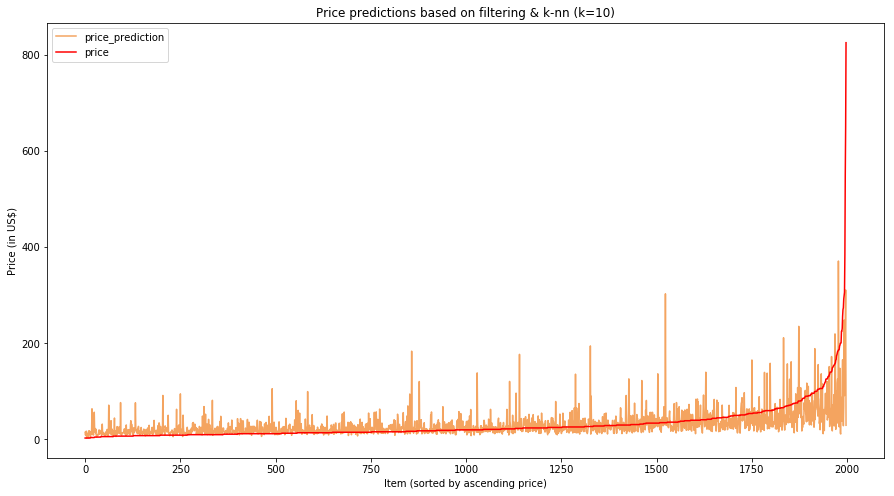

In [41]:
knn_test.sort_values(by=['price'],inplace=True)
plt.figure(figsize=(15,8)) 
x=range(len(knn_test.name))
plt.plot(x,knn_test.price_prediction,'sandybrown')
plt.plot(x,knn_test.price,'red')

plt.title("Price predictions based on filtering & k-nn (k=10)")
plt.legend()
plt.ylabel('Price (in US\$)')
plt.xlabel('Item (sorted by ascending price)')

plt.show()

In [40]:
# Let's compute the prediction error 

print("Average L_2 price error of this model:",\
      round(np.sqrt(np.mean(np.abs(knn_test.price-knn_test.price_prediction)**2)),2),"$")

Average L_2 price error of this model: 36.02 $


### Discussion

This model takes into account many parameters :
* The number of dimensions kept during the SVD on the TFIDF matrix (that we arbitrary set at 20)
* The number of clusters considered when performing k-means on the brands (that we arbitrary set at 20)
* The number of nearest neighbors in the k-nearest neighbors algorithm used for prediction (that we arbitrary set at 10)

Fine-tuning these parameters is quite a difficult work to do and we will not have time to dive very deep in it. Still, we can check if we can improve our results by playing with the numbers of neighbors (`k`=5 and k=`20`).

The following results show that there is no or very little improvement when tuning this parameter.

In [70]:
### k = 5

In [71]:
knn_test_5 = test[test.index.isin(knn_test.index)].copy()

price_prediction = []
print("Please wait we are computing the price predictions. It's going to take a few minutes...")
print(len(knn_test_5.name), " predictions to compute!")
for i in range(len(knn_test_5.name)):
    if i%200 == 0:
        print(i," predictions made so far (", np.floor(i/len(knn_test_5.name)*100),"%)")
    price_prediction += [predictPriceTest(knn_test_5.iloc[i],num_neighbors=5)]
print("Prediction done! Thanks for having waited!")

# Saving data
knn_test_5['price_prediction'] = price_prediction
to_drop = ["TFIDF_feature_"+str(i) for i in range(1,21)]
knn_test_5.drop(to_drop, axis=1, inplace=True)
knn_test_5.to_pickle("price_prediction_KNN_k5.pickle")

Please wait we are computing the price predictions. It's going to take a few minutes...
1998  predictions to compute!
0  predictions made so far ( 0.0 %)
200  predictions made so far ( 10.0 %)
400  predictions made so far ( 20.0 %)
600  predictions made so far ( 30.0 %)
800  predictions made so far ( 40.0 %)
1000  predictions made so far ( 50.0 %)
1200  predictions made so far ( 60.0 %)
1400  predictions made so far ( 70.0 %)
1600  predictions made so far ( 80.0 %)
1800  predictions made so far ( 90.0 %)
Prediction done! Thanks for having waited!


In [72]:
knn_test_5.drop(knn_test[knn_test.price_prediction==-1].index, inplace=True)

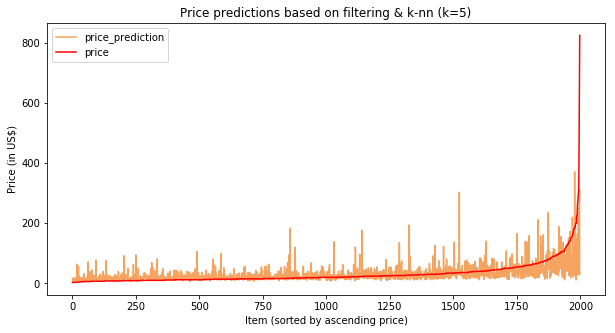

In [94]:
knn_test_5.sort_values(by=['price'],inplace=True)
plt.figure(figsize=(10,5))
x = range(len(knn_test_5.name))
plt.plot(x,knn_test.price_prediction,'sandybrown')
plt.plot(x,knn_test.price,'red')

plt.title("Price predictions based on filtering & k-nn (k=5)")
plt.legend()
plt.ylabel('Price (in US\$)')
plt.xlabel('Item (sorted by ascending price)')

plt.show()

In [75]:
# Let's compute the prediction error 

print("Average L_2 price error of this model:",\
      round(np.sqrt(np.mean(np.abs(knn_test_5.price-knn_test_5.price_prediction)**2)),2),"$")

Average L_2 price error of this model: 36.73 $


In [70]:
### k = 20

In [90]:
knn_test_20 = test[test.index.isin(knn_test.index)].copy()

price_prediction = []
print("Please wait we are computing the price predictions. It's going to take a few minutes...")
print(len(knn_test_20.name), " predictions to compute!")
for i in range(len(knn_test_20.name)):
    if i%200 == 0:
        print(i," predictions made so far (", np.floor(i/len(knn_test_20.name)*100),"%)")
    price_prediction += [predictPriceTest(knn_test_20.iloc[i],num_neighbors=20)]
print("Prediction done! Thanks for having waited!")

# Saving data
knn_test_20['price_prediction'] = price_prediction
to_drop = ["TFIDF_feature_"+str(i) for i in range(1,21)]
knn_test_20.drop(to_drop, axis=1, inplace=True)
knn_test_20.to_pickle("price_prediction_KNN_k20.pickle")

Please wait we are computing the price predictions. It's going to take a few minutes...
1998  predictions to compute!
0  predictions made so far ( 0.0 %)
200  predictions made so far ( 10.0 %)
400  predictions made so far ( 20.0 %)
600  predictions made so far ( 30.0 %)
800  predictions made so far ( 40.0 %)
1000  predictions made so far ( 50.0 %)
1200  predictions made so far ( 60.0 %)
1400  predictions made so far ( 70.0 %)
1600  predictions made so far ( 80.0 %)
1800  predictions made so far ( 90.0 %)
Prediction done! Thanks for having waited!


In [91]:
knn_test_20.drop(knn_test[knn_test.price_prediction==-1].index, inplace=True)

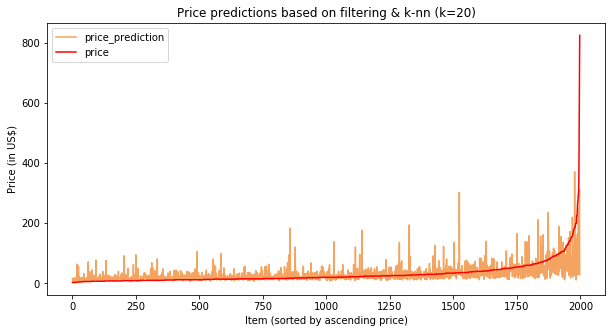

In [92]:
knn_test_20.sort_values(by=['price'],inplace=True)
plt.figure(figsize=(10,5))
x = range(len(knn_test_20.name))
plt.plot(x,knn_test.price_prediction,'sandybrown')
plt.plot(x,knn_test.price,'red')

plt.title("Price predictions based on filtering & k-nn (k=20)")
plt.legend()
plt.ylabel('Price (in US\$)')
plt.xlabel('Item (sorted by ascending price)')

plt.show()

In [93]:
# Let's compute the prediction error 

print("Average L_2 price error of this model:",\
      round(np.sqrt(np.mean(np.abs(knn_test_20.price-knn_test_20.price_prediction)**2)),2),"$")

Average L_2 price error of this model: 36.05 $


# Annex
### A few lines of code for not running the notebook from the start

#### Load the last version of data_mercari (with cleaned tokenized descriptions)

In [2]:
# Opening the Pickle data
with open("data_mercari_removeNanSeparateCat_removeFree_brandNamesCleaned_itemDescriptionCleaned_tokenizedNoStopWord_tokenizedName_LemmatizeDescription_1CharacterFiltered.pickle", 'rb') as f:
    data_mercari = pickle.load(f)

#### Compute the TFIDF matrix

In [13]:
item_description_tokens = data_mercari.item_description_token

TFIDF = TfidfVectorizer(
      input='content',
      lowercase=False,
      preprocessor=lambda x: x,
      tokenizer=lambda key: item_description_tokens[key])

print('We are computing the TFIDF of the data set, please wait a few seconds ...')
# Compute the TFIDF matrix (+create a dictionnary ...)
item_description_tokens_tfidf = TFIDF.fit_transform(item_description_tokens.keys())
print('TFIDF computed, thanks for having waited!')

AttributeError: 'DataFrame' object has no attribute 'item_description_token'

#### Compute SVD on the TFIDF Matrix with 2 or 20 components

In [26]:
### SVD WITH 2 COMPONENTS !
SVD = TruncatedSVD(n_components=2)
item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)

In [5]:
### SVD WITH 20 COMPONENTS !
SVD = TruncatedSVD(n_components=20)
item_description_tokens_tfidf_svd = SVD.fit_transform(item_description_tokens_tfidf)